In [1]:
#Importing the reuired libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import plotly.figure_factory as ff

In [2]:
#Importing the dataset
df = pd.read_csv("heart_failure_clinical_records_dataset.csv")

In [3]:
#having a look at the data
df.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [4]:
df.tail()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
294,62.0,0,61,1,38,1,155000.0,1.1,143,1,1,270,0
295,55.0,0,1820,0,38,0,270000.0,1.2,139,0,0,271,0
296,45.0,0,2060,1,60,0,742000.0,0.8,138,0,0,278,0
297,45.0,0,2413,0,38,0,140000.0,1.4,140,1,1,280,0
298,50.0,0,196,0,45,0,395000.0,1.6,136,1,1,285,0


In [5]:
df.nunique()

age                          47
anaemia                       2
creatinine_phosphokinase    208
diabetes                      2
ejection_fraction            17
high_blood_pressure           2
platelets                   176
serum_creatinine             40
serum_sodium                 27
sex                           2
smoking                       2
time                        148
DEATH_EVENT                   2
dtype: int64

In [6]:
#Dimensions of the data
df.shape

(299, 13)

In [7]:
#Having a look at the data type of all columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [8]:
#Having a look at the null/missing value count
df.isnull().sum()

age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,299.0,60.833893,11.894809,40.0,51.0,60.0,70.0,95.0
anaemia,299.0,0.431438,0.496107,0.0,0.0,0.0,1.0,1.0
creatinine_phosphokinase,299.0,581.839465,970.287881,23.0,116.5,250.0,582.0,7861.0
diabetes,299.0,0.418060,0.494067,0.0,0.0,0.0,1.0,1.0
ejection_fraction,299.0,38.083612,11.834841,14.0,30.0,38.0,45.0,80.0
high_blood_pressure,299.0,0.351171,0.478136,0.0,0.0,0.0,1.0,1.0
platelets,299.0,263358.029264,97804.236869,25100.0,212500.0,262000.0,303500.0,850000.0
serum_creatinine,299.0,1.393880,1.034510,0.5,0.9,1.1,1.4,9.4
serum_sodium,299.0,136.625418,4.412477,113.0,134.0,137.0,140.0,148.0
sex,299.0,0.648829,0.478136,0.0,0.0,1.0,1.0,1.0


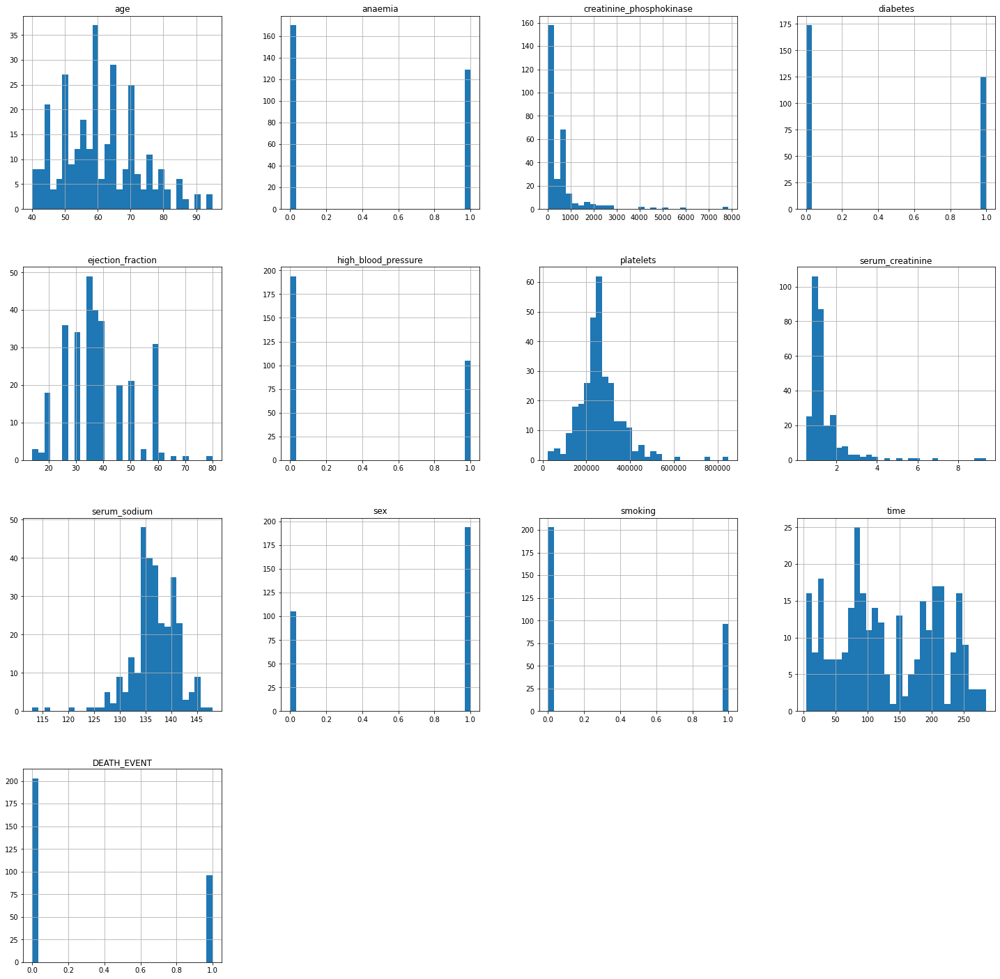

In [10]:
df.hist(bins=30,figsize=(25,25));

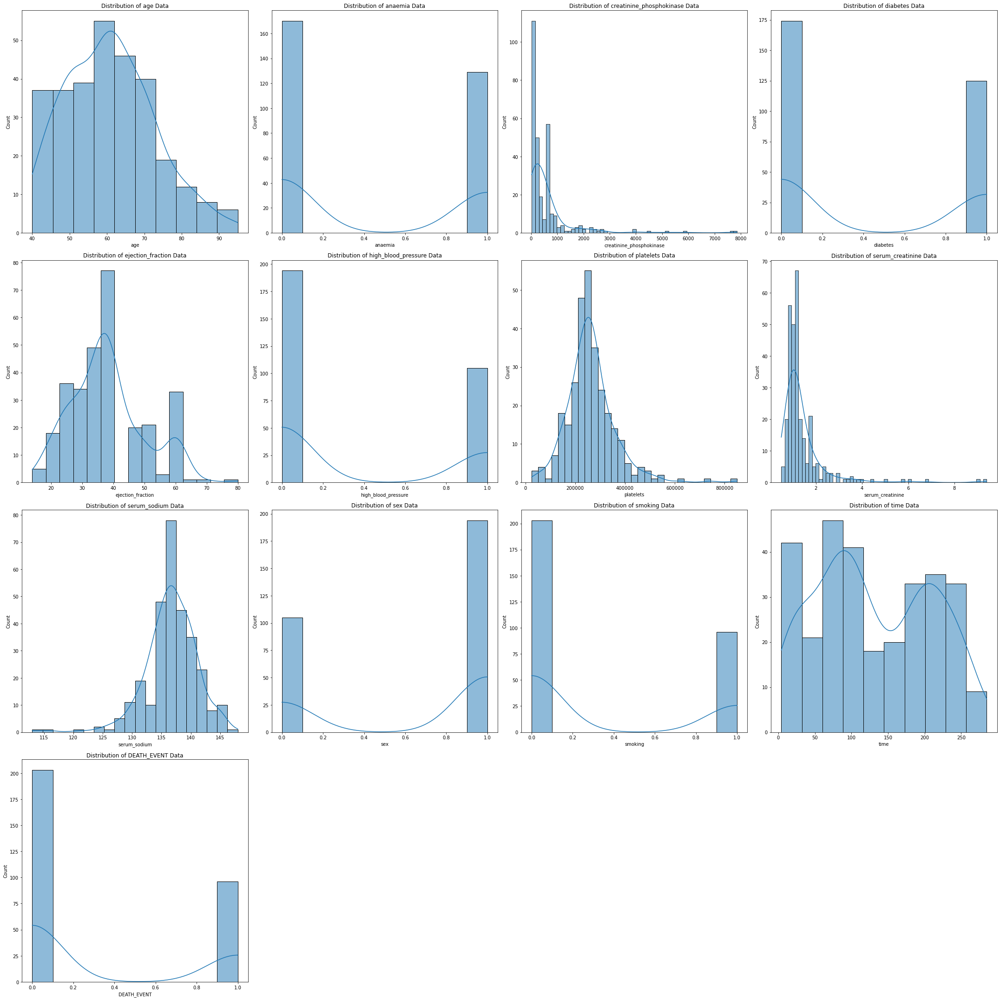

In [11]:
plt.figure(figsize=(30,30))
for i,col in enumerate(df.columns,1):
    plt.subplot(4,4,i)
    plt.title(f"Distribution of {col} Data")
    sns.histplot(df[col],kde=True)
    plt.tight_layout()
    plt.plot()

[]

<Figure size 1800x1440 with 0 Axes>

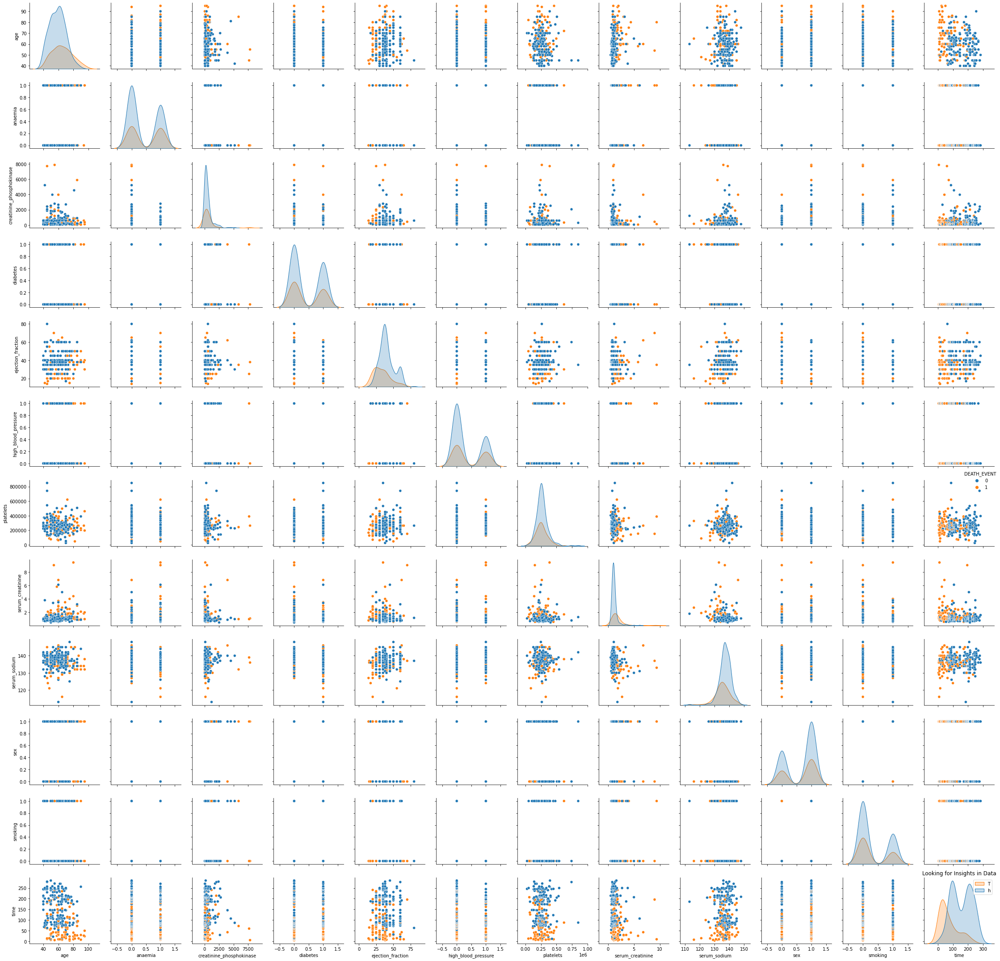

In [12]:
plt.figure(figsize=(25,20))
sns.pairplot(df,hue="DEATH_EVENT")
plt.title("Looking for Insights in Data")
plt.legend("The patient deceased during the follow-up period")
plt.tight_layout()
plt.plot()

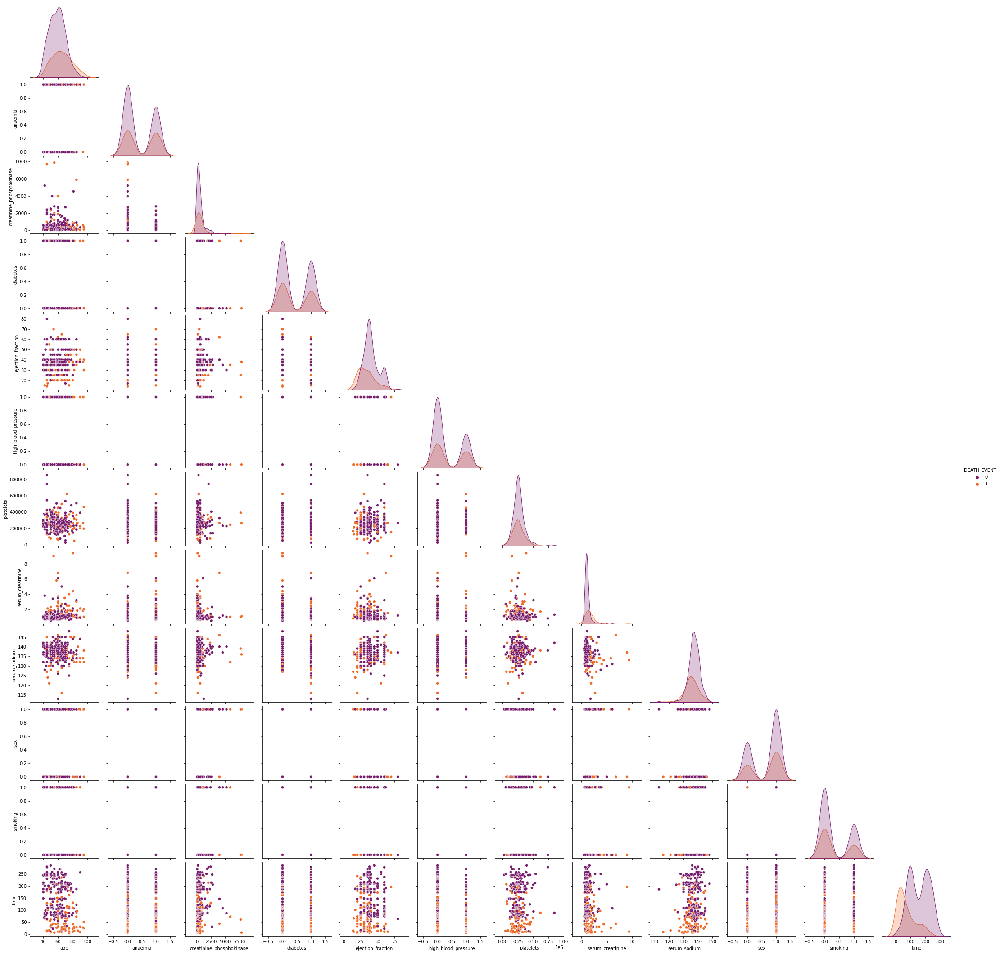

In [13]:
sns.pairplot(df, hue="DEATH_EVENT", palette="inferno", corner=True);

**Observations-**
1. High imbalance of data observed in DEATH_EVENT
2. As the age increase the number of patients decrease
3. Highest occurrence of heart disease is seen in the age 40-70
4. Highly skewed data is seen in ceratinine phosphokinase, serum creatinine and serum sodium
   (Platelets&serum_creatinine: data is right-skewed(can apply logarithm/square root operations))
5. Some of the features show presence of outliers

In [14]:
print("Correlation matrix is:")
df.corr()

Correlation matrix is:


,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
age,1.000000,0.088006,-0.081584,-0.101012,0.060098,0.093289,-0.052354,0.159187,-0.045966,0.065430,0.018668,-0.224068,0.253729
anaemia,0.088006,1.000000,-0.190741,-0.012729,0.031557,0.038182,-0.043786,0.052174,0.041882,-0.094769,-0.107290,-0.141414,0.066270
creatinine_phosphokinase,-0.081584,-0.190741,1.000000,-0.009639,-0.044080,-0.070590,0.024463,-0.016408,0.059550,0.079791,0.002421,-0.009346,0.062728
diabetes,-0.101012,-0.012729,-0.009639,1.000000,-0.004850,-0.012732,0.092193,-0.046975,-0.089551,-0.157730,-0.147173,0.033726,-0.001943
ejection_fraction,0.060098,0.031557,-0.044080,-0.004850,1.000000,0.024445,0.072177,-0.011302,0.175902,-0.148386,-0.067315,0.041729,-0.268603
high_blood_pressure,0.093289,0.038182,-0.070590,-0.012732,0.024445,1.000000,0.049963,-0.004935,0.037109,-0.104615,-0.055711,-0.196439,0.079351
platelets,-0.052354,-0.043786,0.024463,0.092193,0.072177,0.049963,1.000000,-0.041198,0.062125,-0.125120,0.028234,0.010514,-0.049139
serum_creatinine,0.159187,0.052174,-0.016408,-0.046975,-0.011302,-0.004935,-0.041198,1.000000,-0.189095,0.006970,-0.027414,-0.149315,0.294278
serum_sodium,-0.045966,0.041882,0.059550,-0.089551,0.175902,0.037109,0.062125,-0.189095,1.000000,-0.027566,0.004813,0.087640,-0.195204
sex,0.065430,-0.094769,0.079791,-0.157730,-0.148386,-0.104615,-0.125120,0.006970,-0.027566,1.000000,0.445892,-0.015608,-0.004316


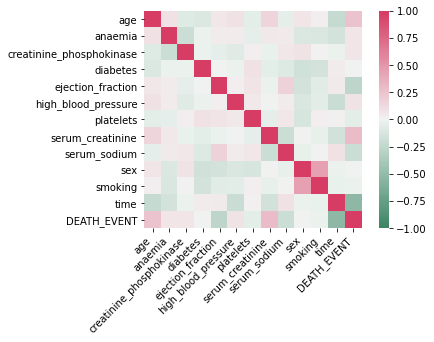

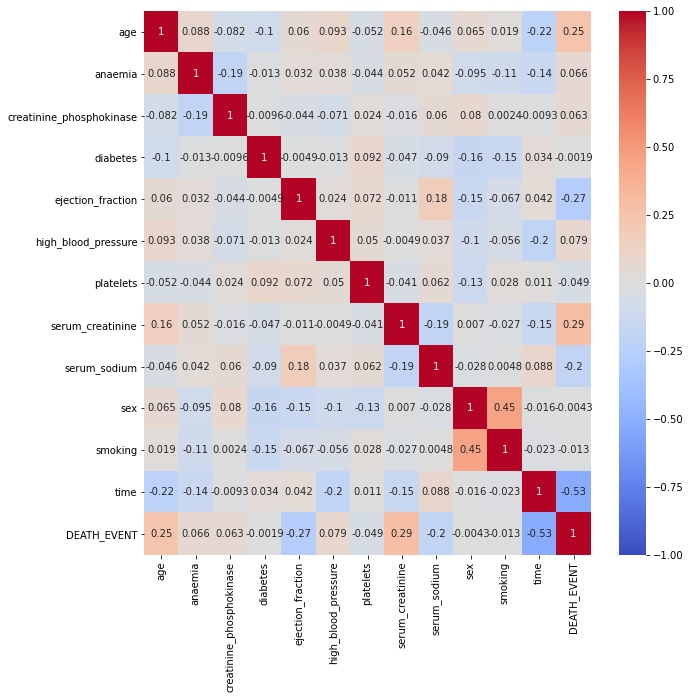

In [15]:
ax = sns.heatmap(
    df.corr(), 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(150,2, n=500),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

plt.figure(figsize=(10,10))
sns.heatmap(df.corr(), vmin=-1, cmap='coolwarm', annot=True);

In [16]:
df.corr()[abs(df.corr()['DEATH_EVENT']) > 0.2]['DEATH_EVENT'] 

age                  0.253729
ejection_fraction   -0.268603
serum_creatinine     0.294278
time                -0.526964
DEATH_EVENT          1.000000
Name: DEATH_EVENT, dtype: float64

In [17]:
df.corr()[abs(df.corr()['DEATH_EVENT']) < 0.1]['DEATH_EVENT'] 

anaemia                     0.066270
creatinine_phosphokinase    0.062728
diabetes                   -0.001943
high_blood_pressure         0.079351
platelets                  -0.049139
sex                        -0.004316
smoking                    -0.012623
Name: DEATH_EVENT, dtype: float64

Highest corrrelation is seen between the variables:
1. **Death event and time** are highly negatively correlated with coefficient value of -0.53
2. **Smoking and sex** are positively correlated with value of 0.45
3. **Serum creatinine and sex** are positively correlated with **death event** with factor of 0.29 and 0.25 respectively.
4. **ejection fraction** is negatively correlated with **death event** with factor -0.27
5. **follow up time and age** are also negatively correlated with a factor of -0.22

Least Correlated variables are:
1. **Diabetes and sex** are least correlated with **death event** with factor of -0.0019 and -0.0043
2. Weakly correlated variables with **creatinine_phosphokinase** are time, smoking, diabetes.
3. Weakly correlated variables with **serum sodium** are smoking.
4. **Serum creatinine and sex** are weakly correlated

### Count of Death Event observed 

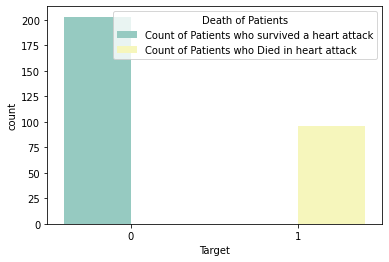

In [18]:
target = sns.countplot(x="DEATH_EVENT", data=df, palette="Set3",hue = 'DEATH_EVENT')
legend_target = target.get_legend()
legend_target.set_title("Death of Patients")
lab_target = legend_target.texts
lab_target[0].set_text("Count of Patients who survived a heart attack")
lab_target[1].set_text("Count of Patients who Died in heart attack")
plt.xlabel("Target")
plt.show()

In [19]:
#Count of target variable in our data
df.DEATH_EVENT.value_counts()
#0-Survived, 1- Dead

0    203
1     96
Name: DEATH_EVENT, dtype: int64

### Percentage of patients survived and died 

In [20]:
death_cnt = len(df[df.DEATH_EVENT == 1])
survive_cnt = len(df[df.DEATH_EVENT == 0])
print("Percentage of Patients that survived the heart attack are: {:.2f}%".format((survive_cnt / (len(df.DEATH_EVENT))*100)))
print("Percentage of Patients who lost their lives because of heart attack are: {:.2f}%".format((death_cnt / (len(df.DEATH_EVENT))*100)))

Percentage of Patients that survived the heart attack are: 67.89%
Percentage of Patients who lost their lives because of heart attack are: 32.11%


In [21]:
fig = go.Figure()
colors = ['plum', 'cornflowerblue']

fig.add_trace(go.Pie(labels=df["DEATH_EVENT"].value_counts(normalize=True).index,
                     values=100*df["DEATH_EVENT"].value_counts(normalize=True).values,
                     marker=dict(colors = colors,line=dict(width=1)), textfont_size=15,
                     hovertemplate="Death Event: %{value:.2f}%<extra></extra>"))

fig.update_layout(title="Target Variable Distribution",
                  width=600, legend=dict(x=0.1, y=1.05))
fig.show()

### Histogram plots for Numerical values

<AxesSubplot:xlabel='creatinine_phosphokinase', ylabel='Count'>

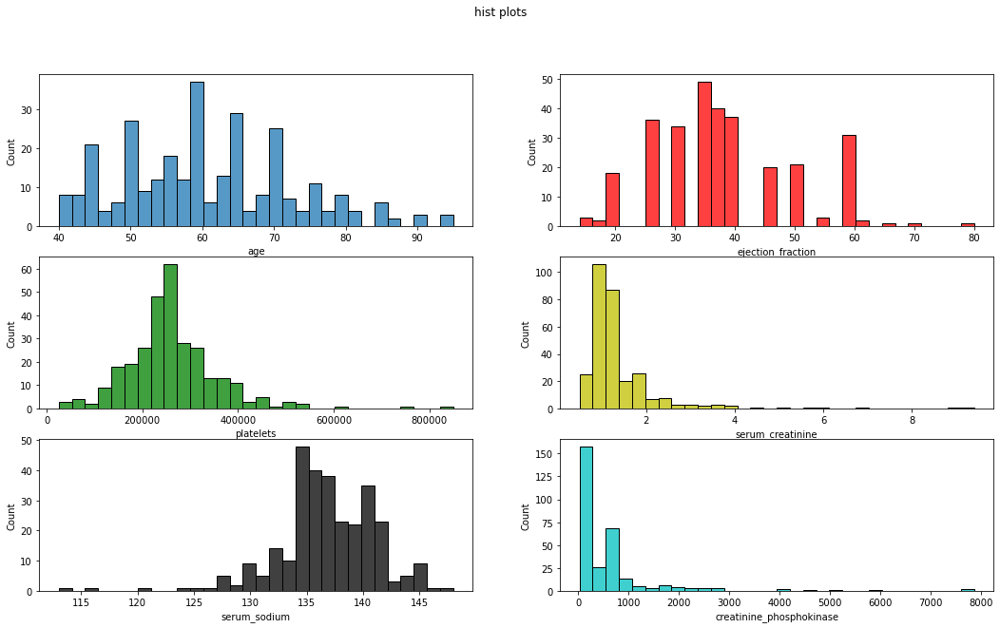

In [22]:
fig, axes = plt.subplots(3, 2, figsize=(18, 10))

fig.suptitle('hist plots')

sns.histplot(df['age'],ax=axes[0,0],bins=30)
sns.histplot(df['ejection_fraction'],ax=axes[0, 1],bins=30,color='r')
sns.histplot(df['platelets'],ax=axes[1, 0],bins=30,color='g')
sns.histplot(df['serum_creatinine'],ax=axes[1, 1],bins=30,color='y') 
sns.histplot(df['serum_sodium'],ax=axes[2, 0],bins=30,color='k') 
sns.histplot(df['creatinine_phosphokinase'],ax=axes[2, 1],bins=30,color='c') 

### Analysis of Heart Attack with respect to Sex

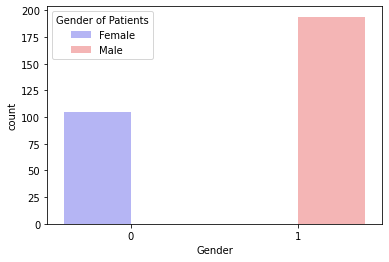

In [23]:
#Count of Male and Female in the dataset
sex = sns.countplot(x='sex', data=df, palette="bwr",hue = 'sex')
legend_sex = sex.get_legend()
legend_sex.set_title("Gender of Patients")
lab_sex = legend_sex.texts
lab_sex[0].set_text("Female")
lab_sex[1].set_text("Male")
plt.xlabel("Gender")
plt.show()

In [24]:
#Percentage of each sex count 
Female_cnt = len(df[df.sex == 0])
Male_cnt = len(df[df.sex == 1])
print("Percentage of Female Patients who had a heart attack: {:.2f}%".format((Female_cnt / (len(df.sex))*100)))
print("Percentage of Male Patients who had a heart attack: {:.2f}%".format((Male_cnt / (len(df.sex))*100)))

Percentage of Female Patients who had a heart attack: 35.12%
Percentage of Male Patients who had a heart attack: 64.88%


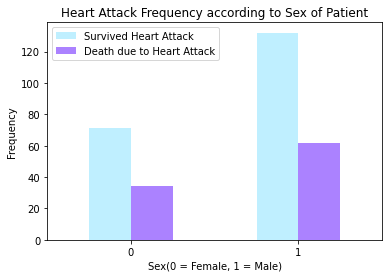

In [25]:
pd.crosstab(df.sex,df.DEATH_EVENT).plot(kind="bar",color=['#BFEFFF','#AB82FF'])
plt.title('Heart Attack Frequency according to Sex of Patient')
plt.xlabel('Sex(0 = Female, 1 = Male)')
plt.xticks(rotation=0)
plt.legend(["Survived Heart Attack", "Death due to Heart Attack"])
plt.ylabel('Frequency')
plt.show()

In [26]:
fig=px.histogram(df, 
                 x="DEATH_EVENT",
                 color="sex",
                 hover_data=df.columns,
                 title="Distribution of Heart Diseases",
                 barmode="group")
fig.show()

In [27]:
d1 = df[(df["DEATH_EVENT"]==0) & (df["sex"]==1)]
d2 = df[(df["DEATH_EVENT"]==1) & (df["sex"]==1)]
d3 = df[(df["DEATH_EVENT"]==0) & (df["sex"]==0)]
d4 = df[(df["DEATH_EVENT"]==1) & (df["sex"]==0)]

label1 = ["Male","Female"]
label2 = ['Male - Survived','Male - Died', "Female -  Survived", "Female - Died"]
values1 = [(len(d1)+len(d2)), (len(d3)+len(d4))]
values2 = [len(d1),len(d2),len(d3),len(d4)]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=label1, values=values1, name="GENDER",marker=dict(colors = ['#BFEFFF','#AB82FF'])),
              1, 1)
fig.add_trace(go.Pie(labels=label2, values=values2, name="GENDER VS DEATH_EVENT",marker=dict(colors = ['#BCEE68','#79CDCD','#B4CDCD','#EEAEEE'])),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent")

fig.update_layout(
    title_text="GENDER DISTRIBUTION IN THE DATASET  \
                   GENDER VS DEATH_EVENT",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='GENDER', x=0.19, y=0.5, font_size=15, showarrow=False),
                 dict(text='GENDER VS DEATH_EVENT', x=0.86, y=0.5, font_size=9, showarrow=False)],
    autosize=False,width=1000, height=500, paper_bgcolor="white")

fig.show()

Insight: From the above subplot we can conclude that in our dataset 65.3% are MALE (out of which 44.4% survived and 20.9% died) and 34.7% are FEMALE (out of which 23.6% survived and 11.1% died).

### Analysis related to Age

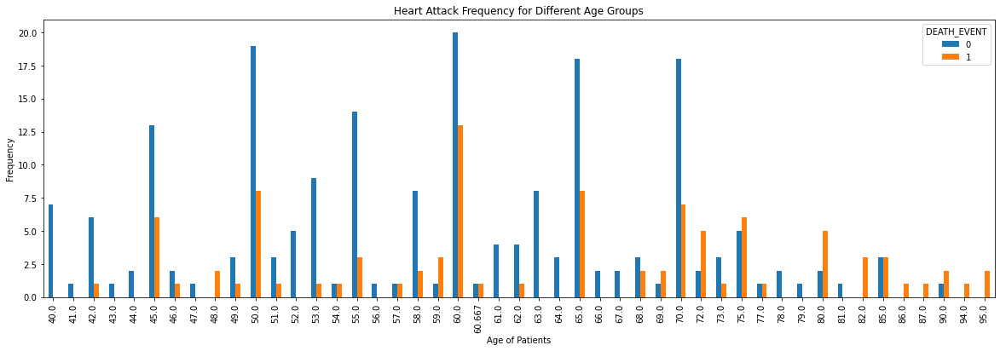

In [28]:
pd.crosstab(df.age,df.DEATH_EVENT).plot(kind="bar",figsize=(20,6))
plt.title('Heart Attack Frequency for Different Age Groups')
plt.xlabel('Age of Patients')
plt.ylabel('Frequency')
plt.show()

In [29]:
surv = df[df["DEATH_EVENT"]==0]["age"]
not_surv = df[df["DEATH_EVENT"]==1]["age"]
hist_data = [surv,not_surv]
group_labels = ['Survived', 'Not Survived']
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.5)
fig.update_layout(
    title_text="Analysis in Age on Survival Status")
fig.show()

As age increases the survival chances are reduced.
The survival chances in early 40 and in the age group 40-70 is high

In [30]:
fig = px.violin(df, y="age", x="sex", color="DEATH_EVENT", box=True, points="all", hover_data=df.columns)
fig.update_layout(title_text="Analysis in Age and Gender on Survival Status")
fig.show()

The survival is usually high for feamale in the age group 60-70 and for male in the age 50-65.
The occurrence of death event is almost the same in male and female and usually in the age group 50-70

In [31]:
fig = px.violin(df, y="age", x="smoking", color="DEATH_EVENT", box=True, points="all", hover_data=df.columns)
fig.update_layout(title_text="Analysis in Age and Smoking on Survival Status")
fig.show()

In [32]:
fig=px.histogram(df, 
                 x="DEATH_EVENT",
                 color="smoking",
                 hover_data=df.columns,
                 title="Distribution of Heart Diseases",
                 barmode="group")
fig.show()

The chances of survival in the age group 55-65 are high for non-smokers and in case of smokers it is high in the range of 50-60.
The death event for smoking group is high as compared to non-smoking population.


In [33]:
fig = px.violin(df, y="age", x="diabetes", color="DEATH_EVENT", box=True, points="all", hover_data=df.columns)
fig.update_layout(title_text="Analysis in Age and Diabetes on Survival Status")
fig.show()

The people having diabetes does not show any effect on death event with respect to age group. The distribution of death event for diabetic people is almost the same. Same applicable to non-doabetic group

### Ejection Fraction analysis

In [34]:
fig=px.histogram(df, 
                 x="DEATH_EVENT",
                 color="ejection_fraction",
                 hover_data=df.columns,
                 title="Distribution of Heart Diseases",
                 barmode="group")
fig.show()

In [35]:
fig = px.histogram(df, x="ejection_fraction", color="DEATH_EVENT", marginal="box", hover_data=df.columns,title ="Distribution of EJECTION FRACTION Vs DEATH_EVENT", 
                   labels={"ejection_fraction": "EJECTION FRACTION"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [36]:
#Distribution plots for survived and not survived
surv = df[df['DEATH_EVENT']==0]['ejection_fraction']
not_surv = df[df['DEATH_EVENT']==1]['ejection_fraction']
hist_data = [surv,not_surv]
group_labels = ['Survived', 'Not Survived']
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.5)
fig.update_layout(
    title_text="Analysis in Ejection Fraction on Survival Status")
fig.show()


The highest ejection fraction is is around 35 in both survived and non-survived patients and it is observed to be high in survived patients as compared to patients who died after the heart attack.


### Serum Sodium

In [37]:
fig=px.histogram(df, 
                 x="DEATH_EVENT",
                 color="serum_sodium",
                 hover_data=df.columns,
                 title="Distribution of Heart Diseases",
                 barmode="group")
fig.show()

In [38]:
fig = px.histogram(df, x="serum_sodium", color="DEATH_EVENT", marginal="violin",hover_data=df.columns,title ="Distribution of SERUM SODIUM Vs DEATH_EVENT", 
                   labels={"serum_sodium": "SERUM SODIUM"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [39]:
#Distribution plots for survived and not survived
surv = df[df['DEATH_EVENT']==0]['serum_sodium']
not_surv = df[df['DEATH_EVENT']==1]['serum_sodium']
hist_data = [surv,not_surv]
group_labels = ['Survived', 'Not Survived']
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.5)
fig.update_layout(
    title_text="Analysis in Serum Sodium on Survival Status")
fig.show()

Observations are similar to  ejection fraction, high frequency are observed in survived patients than in non-survived patients. Distribution of data is left skew.

### serum creatinine

In [40]:

fig=px.histogram(df, 
                 x="DEATH_EVENT",
                 color="serum_creatinine",
                 hover_data=df.columns,
                 title="Distribution of Heart Diseases",
                 barmode="group")
fig.show()

In [41]:
fig = px.histogram(df, x="serum_creatinine", color="DEATH_EVENT", marginal="violin", hover_data=df.columns,title ="Distribution of SERUM CREATININE Vs DEATH_EVENT", 
                   labels={"serum_creatinine": "SERUM CREATININE"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [42]:
surv = df[df['DEATH_EVENT']==0]['serum_creatinine']
not_surv = df[df['DEATH_EVENT']==1]['serum_creatinine']
hist_data = [surv,not_surv]
group_labels = ['Survived', 'Not Survived']
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.5)
fig.update_layout(
    title_text="Analysis in Serum Creatinine on Survival Status")
fig.show()

The data is highly right skewed, and similar to above higher levels are observed in survived patients.

### Creatinine Phosphokinase

In [43]:
fig=px.histogram(df, 
                 x="DEATH_EVENT",
                 color="creatinine_phosphokinase",
                 hover_data=df.columns,
                 title="Distribution of Heart Diseases",
                 barmode="group")
fig.show()

In [44]:
fig = px.histogram(df, x="creatinine_phosphokinase", color="DEATH_EVENT", marginal="violin", hover_data=df.columns,title ="Distribution of CREATININE PHOSPHOKINASE Vs DEATH_EVENT", 
                   labels={"creatinine_phosphokinase": "CREATININE PHOSPHOKINASE"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [45]:
surv = df[df['DEATH_EVENT']==0]['creatinine_phosphokinase']
not_surv = df[df['DEATH_EVENT']==1]['creatinine_phosphokinase']
hist_data = [surv,not_surv]
group_labels = ['Survived', 'Not Survived']
fig = ff.create_distplot(hist_data, group_labels, bin_size=0.5)
fig.update_layout(
    title_text="Analysis in Serum Creatinine on Survival Status")
fig.show()

### Serum sodium and Age

<AxesSubplot:xlabel='serum_sodium', ylabel='age'>

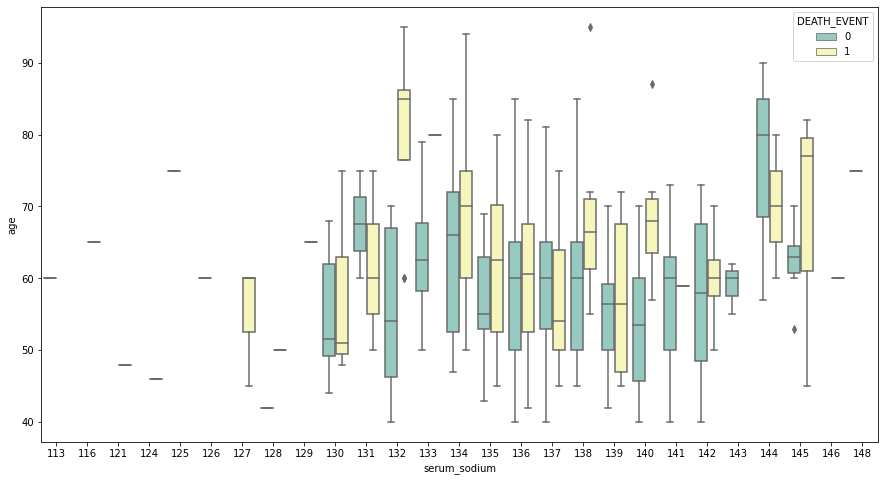

In [46]:
plt.figure(figsize = (15,8))
sns.boxplot(x="serum_sodium", y="age", hue="DEATH_EVENT",data=df, palette="Set3")

### Outliers Detection using Box Plots for Numerical Variables

In [47]:
fig = px.box(df,y="age",x="DEATH_EVENT",title=f"Distrubution of Age")
fig.show()

In [48]:
fig = px.box(df,y="creatinine_phosphokinase",x="DEATH_EVENT",title=f"Distrubution of Creatinine Phosphokinase")
fig.show()

In [49]:
fig = px.box(df,y="ejection_fraction",x="DEATH_EVENT",title=f"Distrubution of Ejection Fraction")
fig.show()

In [50]:
fig = px.box(df,y="platelets",x="DEATH_EVENT",title=f"Distrubution of Platelets")
fig.show()

In [51]:
fig = px.box(df,y="serum_creatinine",x="DEATH_EVENT",title=f"Distrubution of Serum Creatinine")
fig.show()

In [52]:
fig = px.box(df,y="serum_sodium",x="DEATH_EVENT",title=f"Distrubution of Serum Sodium")
fig.show()

In [53]:
fig = px.box(df,y="time",x="DEATH_EVENT",title=f"Distrubution of Follow-up Time")
fig.show()

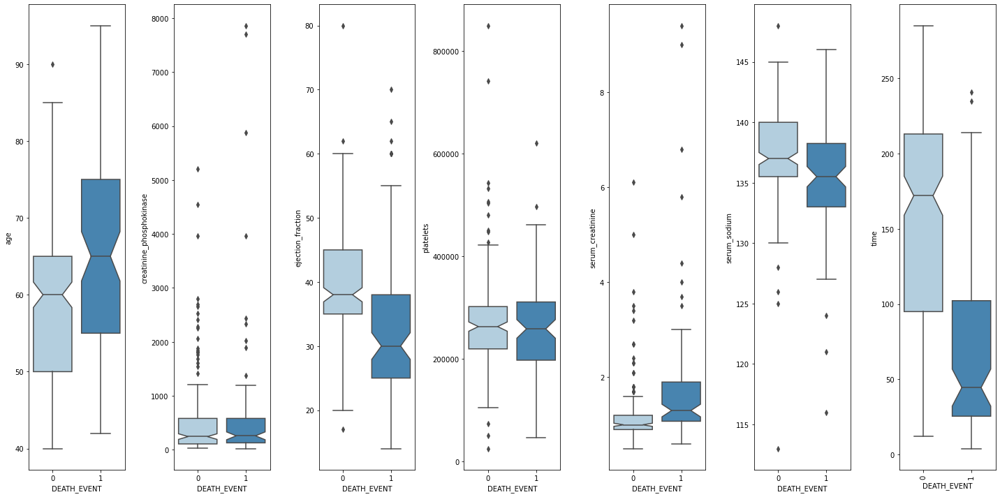

In [56]:
#Boxplot for outliers for comaparison
columns = ['age', 'creatinine_phosphokinase', 'ejection_fraction', 'platelets', 'serum_creatinine','serum_sodium', 'time']

fig,ax=plt.subplots(nrows=1,ncols=len(columns),figsize=(20,10))

for i,column in enumerate(columns):
    sns.boxplot(data=df,y=column,ax=ax[i],x='DEATH_EVENT', notch=True,palette="Blues")
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('C:/Users/asus/Documents/Dissertation/Last update/Images/HighResImages/boxplot.png', dpi=300)



### Count for Categorical Variable

In [55]:
print("Count of patients with anaemia:")
print(df['anaemia'].value_counts())

print("Count of patients with diabetes:")
print(df['diabetes'].value_counts())

print("Count of patients with high blood pressure:")
print(df['high_blood_pressure'].value_counts())

print("Count of patients with smoking:")
print(df['smoking'].value_counts())

Count of patients with anaemia:
0    170
1    129
Name: anaemia, dtype: int64
Count of patients with diabetes:
0    174
1    125
Name: diabetes, dtype: int64
Count of patients with high blood pressure:
0    194
1    105
Name: high_blood_pressure, dtype: int64
Count of patients with smoking:
0    203
1     96
Name: smoking, dtype: int64


### Histogram Plots for Categorical Values

<AxesSubplot:xlabel='DEATH_EVENT', ylabel='count'>

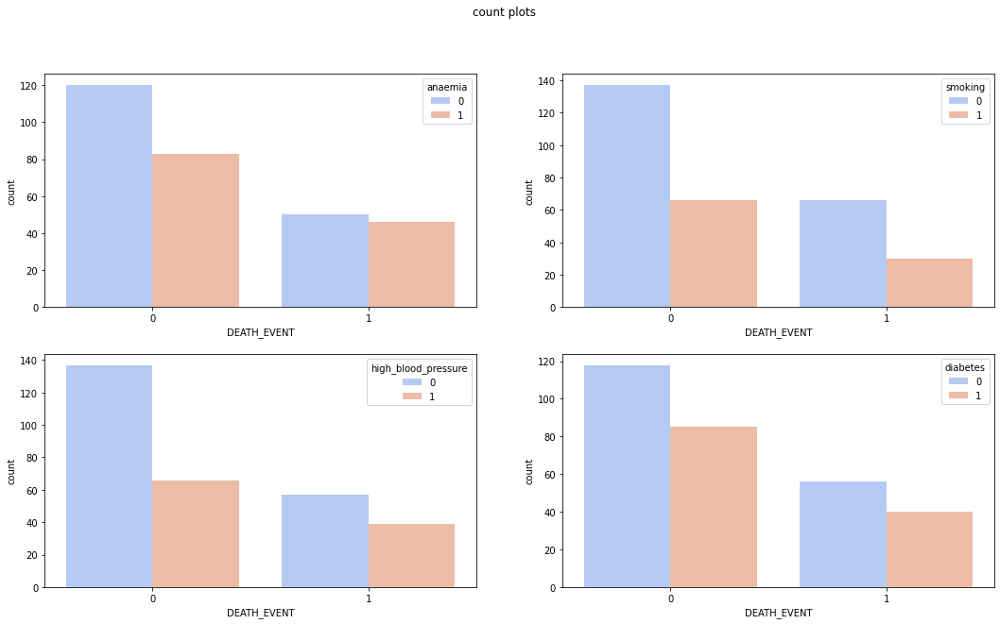

In [56]:
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

fig.suptitle('count plots')

sns.countplot(ax=axes[0, 0],x='DEATH_EVENT',hue='anaemia',data=df,palette='coolwarm')
sns.countplot(ax=axes[0, 1],x='DEATH_EVENT',hue='smoking',data=df,palette='coolwarm')
sns.countplot(ax=axes[1, 0],x='DEATH_EVENT',hue='high_blood_pressure',data=df,palette='coolwarm')
sns.countplot(ax=axes[1, 1],x='DEATH_EVENT',hue='diabetes',data=df,palette='coolwarm')

In [57]:
categorical_cols = df[['diabetes','anaemia','smoking','sex','high_blood_pressure','DEATH_EVENT']]
seaborn_cols = ['#e2d810', '#12a4d9']
fig = px.parallel_categories(categorical_cols, color="DEATH_EVENT", color_continuous_scale=seaborn_cols)
fig.show()

#Whole dataset
#fig = px.parallel_coordinates(df, color = 'DEATH_EVENT')
#fig.show()

#fig1 = px.parallel_categories(df, color = 'DEATH_EVENT', color_continuous_scale=seaborn_cols)
#fig1.show()

### Data distribution for Diabetic patients

In [58]:
d1 = df[(df["DEATH_EVENT"]==0) & (df["diabetes"]==1)]
d2 = df[(df["DEATH_EVENT"]==1) & (df["diabetes"]==1)]
d3 = df[(df["DEATH_EVENT"]==0) & (df["diabetes"]==0)]
d4 = df[(df["DEATH_EVENT"]==1) & (df["diabetes"]==0)]

label1 = ["Diabetic","Non-Diabetic"]
label2 = ['Diabetic - Survived','Diabetic - Died', "Non-Diabetic -  Survived", "Non-Diabetic - Died"]
values1 = [(len(d1)+len(d2)), (len(d3)+len(d4))]
values2 = [len(d1),len(d2),len(d3),len(d4)]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=label1, values=values1, name="DIABETES",marker=dict(colors = ['#BFEFFF','#AB82FF'])),
              1, 1)
fig.add_trace(go.Pie(labels=label2, values=values2, name="DIABETES VS DEATH_EVENT",marker=dict(colors = ['#BCEE68','#79CDCD','#B4CDCD','#EEAEEE'])),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.5, hoverinfo="label+percent")

fig.update_layout(
    title_text="DIABETES DISTRIBUTION IN THE DATASET  \
                   DIABETES VS DEATH_EVENT",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='DIABETES', x=0.19, y=0.5, font_size=15, showarrow=False),
                 dict(text='DIABETES VS DEATH_EVENT', x=0.85, y=0.5, font_size=9, showarrow=False)],
    autosize=False,width=1200, height=500, paper_bgcolor="white")

fig.show()

From the above subplot we can conclude that in our dataset 57.9% are NON DIABETIC (out of which 39.4% survived and 18.5% died) and 42.1% are DIABETIC (out of which 28.6% survived and 13.5% died).

### Data distribution for High Blood pressure Patients

In [59]:
d1 = df[(df["DEATH_EVENT"]==0) & (df["high_blood_pressure"]==1)]
d2 = df[(df["DEATH_EVENT"]==1) & (df["high_blood_pressure"]==1)]
d3 = df[(df["DEATH_EVENT"]==0) & (df["high_blood_pressure"]==0)]
d4 = df[(df["DEATH_EVENT"]==1) & (df["high_blood_pressure"]==0)]

label1 = ["Hypertension","No-Hypertension"]
label2 = ['Hypertension - Survived','Hypertension - Died', "No-Hypertension -  Survived", "No-Hypertension - Died"]
values1 = [(len(d1)+len(d2)), (len(d3)+len(d4))]
values2 = [len(d1),len(d2),len(d3),len(d4)]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=label1, values=values1, name="HYPERTENSION",marker=dict(colors = ['#BFEFFF','#AB82FF'])),
              1, 1)
fig.add_trace(go.Pie(labels=label2, values=values2, name="HYPERTENSION VS DEATH_EVENT",marker=dict(colors = ['#BCEE68','#79CDCD','#B4CDCD','#EEAEEE'])),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.5, hoverinfo="label+percent")

fig.update_layout(
    title_text="HYPERTENSION DISTRIBUTION IN THE DATASET  \
                   HYPERTENSION VS DEATH_EVENT",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='HYPERTENSION', x=0.16, y=0.5, font_size=15, showarrow=False),
                 dict(text='HYPERTENSION VS DEATH_EVENT', x=0.87, y=0.5, font_size=9, showarrow=False)],
    autosize=False,width=1200, height=500, paper_bgcolor="white")

fig.show()

### Data Distribution for Smoking Patients

In [60]:
d1 = df[(df["DEATH_EVENT"]==0) & (df["smoking"]==1)]
d2 = df[(df["DEATH_EVENT"]==1) & (df["smoking"]==1)]
d3 = df[(df["DEATH_EVENT"]==0) & (df["smoking"]==0)]
d4 = df[(df["DEATH_EVENT"]==1) & (df["smoking"]==0)]

label1 = ["Smoking","No-Smoking"]
label2 = ['Smoking - Survived','Smoking - Died', "No Smoking - Survived", "No Smoking - Died"]
values1 = [(len(d1)+len(d2)), (len(d3)+len(d4))]
values2 = [len(d1),len(d2),len(d3),len(d4)]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=label1, values=values1, name="SMOKING",marker=dict(colors = ['#BFEFFF','#AB82FF'])),
              1, 1)
fig.add_trace(go.Pie(labels=label2, values=values2, name="SMOKING VS DEATH_EVENT",marker=dict(colors = ['#BCEE68','#79CDCD','#B4CDCD','#EEAEEE'])),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.5, hoverinfo="label+percent")

fig.update_layout(
    title_text="SMOKING DISTRIBUTION IN THE DATASET  \
                   SMOKING VS DEATH_EVENT",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='SMOKING', x=0.18, y=0.5, font_size=15, showarrow=False),
                 dict(text='SMOKING VS DEATH_EVENT', x=0.85, y=0.5, font_size=9, showarrow=False)],
    autosize=False,width=1200, height=500, paper_bgcolor="white")

fig.show()

### anaemia

In [61]:
d1 = df[(df["DEATH_EVENT"]==0) & (df["anaemia"]==1)]
d2 = df[(df["DEATH_EVENT"]==1) & (df["anaemia"]==1)]
d3 = df[(df["DEATH_EVENT"]==0) & (df["anaemia"]==0)]
d4 = df[(df["DEATH_EVENT"]==1) & (df["anaemia"]==0)]

label1 = ["Anaemia","No Anaemia"]
label2 = ['Anaemia - Survived','Anaemia - Died', "No Anaemia -  Survived", "No Anaemia  - Died"]
values1 = [(len(d1)+len(d2)), (len(d3)+len(d4))]
values2 = [len(d1),len(d2),len(d3),len(d4)]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=label1, values=values1, name="ANAEMIA",marker=dict(colors = ['#BFEFFF','#AB82FF'])),
              1, 1)
fig.add_trace(go.Pie(labels=label2, values=values2, name="ANAEMIA VS DEATH_EVENT",marker=dict(colors = ['#BCEE68','#79CDCD','#B4CDCD','#EEAEEE'])),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.5, hoverinfo="label+percent")

fig.update_layout(
    title_text="ANAEMIA DISTRIBUTION IN THE DATASET  \
                   ANAEMIA VS DEATH_EVENT",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='ANAEMIA', x=0.18, y=0.5, font_size=15, showarrow=False),
                 dict(text='ANAEMIA VS DEATH_EVENT', x=0.85, y=0.5, font_size=9, showarrow=False)],
    autosize=False,width=1200, height=500, paper_bgcolor="white")

fig.show()

### Relation of Age with Cateogrical Values

In [62]:
fig = px.histogram(df, x="age", color="diabetes", marginal="violin",hover_data=df.columns,
                   title ="Distribution of AGE Vs DIABETES", 
                   labels={"diabetes": "DIABETES", "age": "AGE"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [63]:
fig = px.histogram(df, x="age", color="anaemia", marginal="violin",hover_data=df.columns,
                   title ="Distribution of AGE Vs ANAEMIA", 
                   labels={"anaemia": "ANAEMIA", "age": "AGE"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [64]:
fig = px.histogram(df, x="age", color="high_blood_pressure", marginal="violin",hover_data=df.columns,
                   title ="Distribution of AGE Vs HIGH BLOOD PRESSURE", 
                   labels={"high_blood_pressure": "HIGH BLOOD PRESSURE", "age": "AGE"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [65]:
fig = px.histogram(df, x="age", color="smoking", marginal="violin",hover_data=df.columns,
                   title ="Distribution of AGE Vs SMOKING", 
                   labels={"smoking": "SMOKING", "age": "AGE"},
                   color_discrete_map={"0": "RebeccaPurple", "1": "MediumPurple"})
fig.show()

In [66]:
skew_vals = df.skew().sort_values(ascending=False)
skew_vals

creatinine_phosphokinase    4.463110
serum_creatinine            4.455996
platelets                   1.462321
DEATH_EVENT                 0.770349
smoking                     0.770349
high_blood_pressure         0.626732
ejection_fraction           0.555383
age                         0.423062
diabetes                    0.333929
anaemia                     0.278261
time                        0.127803
sex                        -0.626732
serum_sodium               -1.048136
dtype: float64

Text(0, 0.5, 'Num people')

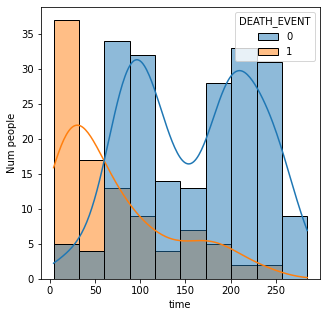

In [67]:
f,ax = plt.subplots(figsize=(5,5))
sns.histplot(x='time',data=df,hue='DEATH_EVENT',kde=True)
plt.ylabel('Num people')

### KAPLAN MEIER TEST

In [68]:
from lifelines import KaplanMeierFitter

In [69]:
kmft = KaplanMeierFitter()

### Goal is to find the number of days a patient survived before they died

In [70]:
kmft.fit(durations = df['time'], event_observed = df['DEATH_EVENT'])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 299 total observations, 203 right-censored observations>

In [71]:
kmft.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,299,299
4.0,1,1,0,0,299
6.0,1,1,0,0,298
7.0,2,2,0,0,297
8.0,2,2,0,0,295
...,...,...,...,...,...
270.0,2,0,2,0,6
271.0,1,0,1,0,4
278.0,1,0,1,0,3


In [72]:
kmft.survival_function_

,KM_estimate
timeline,
0.0,1.000000
4.0,0.996656
6.0,0.993311
7.0,0.986622
8.0,0.979933
...,...
270.0,0.575705
271.0,0.575705
278.0,0.575705


In [73]:
#the number of days where on average, 50% of patients survived.
kmft.median_survival_time_

inf

### Identyfing the survival period for the patient

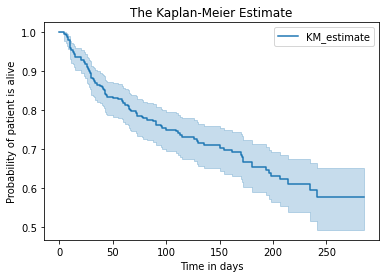

In [74]:
kmft.plot()
plt.title("The Kaplan-Meier Estimate")
plt.ylabel("Probability of patient is alive")
plt.xlabel("Time in days")
plt.show()

In [75]:
kmft.confidence_interval_

,KM_estimate_lower_0.95,KM_estimate_upper_0.95
0.0,1.000000,1.000000
4.0,0.976498,0.999528
6.0,0.973522,0.998323
7.0,0.964751,0.994958
8.0,0.955881,0.990935
...,...,...
270.0,0.491856,0.650723
271.0,0.491856,0.650723
278.0,0.491856,0.650723
280.0,0.491856,0.650723


From above we can see that initially, the survival chances of the patient are very high and as time increase the chances decrease.
We can now have look at the cumulative frequency of the timeline for a patient.

### Cumulative Density

In [76]:
kmft.cumulative_density_

,KM_estimate
timeline,
0.0,0.000000
4.0,0.003344
6.0,0.006689
7.0,0.013378
8.0,0.020067
...,...
270.0,0.424295
271.0,0.424295
278.0,0.424295


<AxesSubplot:xlabel='timeline'>

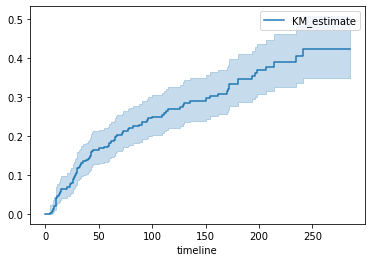

In [77]:
kmft.plot_cumulative_density()

As the number of survival days increases, the probability of a person dying increases.

### Calculating the Hazard function

In [78]:
from lifelines import NelsonAalenFitter

In [79]:
naf = NelsonAalenFitter()

naf.fit(df['time'],event_observed = df['DEATH_EVENT'])

<lifelines.NelsonAalenFitter:"NA_estimate", fitted with 299 total observations, 203 right-censored observations>

In [80]:
naf.cumulative_hazard_

,NA_estimate
timeline,
0.0,0.000000
4.0,0.003344
6.0,0.006700
7.0,0.013446
8.0,0.020237
...,...
270.0,0.549677
271.0,0.549677
278.0,0.549677


<AxesSubplot:xlabel='timeline'>

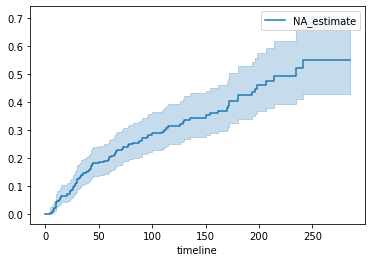

In [81]:
naf.plot_cumulative_hazard()

### Kaplan-Meier Estimator with groups 
#### Anaemia


In [82]:
#We will perform survival analysis of all categoricak values with death event
kmf_anaemia = KaplanMeierFitter()
kmf_no_anaemia = KaplanMeierFitter()

#Divide the data into groups 
Anaemia = df.query('anaemia == 1')
No_Anaemia = df.query('anaemia == 0')

In [83]:
kmf_anaemia.fit(durations = Anaemia['time'], event_observed = Anaemia['DEATH_EVENT'], label = 'Anaemic')

kmf_no_anaemia.fit(durations = No_Anaemia['time'], event_observed = No_Anaemia['DEATH_EVENT'], label = 'Non-Anaemic')

<lifelines.KaplanMeierFitter:"Non-Anaemic", fitted with 170 total observations, 120 right-censored observations>

In [84]:
kmf_anaemia.event_table



,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,129,129
7.0,1,1,0,0,129
8.0,2,2,0,0,128
10.0,4,4,0,0,126
11.0,2,2,0,0,122
...,...,...,...,...,...
245.0,1,0,1,0,6
246.0,1,0,1,0,5
250.0,2,0,2,0,4


In [85]:
kmf_no_anaemia.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,170,170
4.0,1,1,0,0,170
6.0,1,1,0,0,169
7.0,1,1,0,0,168
10.0,2,2,0,0,167
...,...,...,...,...,...
270.0,1,0,1,0,5
271.0,1,0,1,0,4
278.0,1,0,1,0,3


In [86]:
kmf_no_anaemia.survival_function_

,Non-Anaemic
timeline,
0.0,1.000000
4.0,0.994118
6.0,0.988235
7.0,0.982353
10.0,0.970588
...,...
270.0,0.618576
271.0,0.618576
278.0,0.618576


In [87]:
kmf_anaemia.survival_function_

,Anaemic
timeline,
0.0,1.000000
7.0,0.992248
8.0,0.976744
10.0,0.945736
11.0,0.930233
...,...
245.0,0.511037
246.0,0.511037
250.0,0.511037


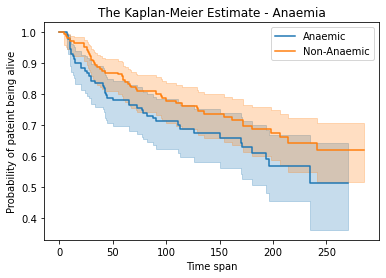

In [88]:
kmf_anaemia.plot()
kmf_no_anaemia.plot()

plt.title("The Kaplan-Meier Estimate - Anaemia")
plt.ylabel("Probability of pateint being alive")
plt.xlabel("Time span")
plt.show()

In [89]:
kmf_anaemia.cumulative_density_

,Anaemic
timeline,
0.0,0.000000
7.0,0.007752
8.0,0.023256
10.0,0.054264
11.0,0.069767
...,...
245.0,0.488963
246.0,0.488963
250.0,0.488963


In [90]:
kmf_no_anaemia.cumulative_density_

,Non-Anaemic
timeline,
0.0,0.000000
4.0,0.005882
6.0,0.011765
7.0,0.017647
10.0,0.029412
...,...
270.0,0.381424
271.0,0.381424
278.0,0.381424


<AxesSubplot:xlabel='timeline'>

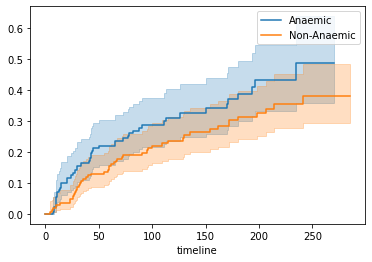

In [91]:
kmf_anaemia.plot_cumulative_density()
kmf_no_anaemia.plot_cumulative_density()

In [92]:
naf_anaemia = NelsonAalenFitter()
naf_no_anaemia = NelsonAalenFitter()

naf_anaemia.fit(Anaemia['time'],event_observed = Anaemia['DEATH_EVENT'])
naf_no_anaemia.fit(No_Anaemia['time'],event_observed = No_Anaemia['DEATH_EVENT'])

<lifelines.NelsonAalenFitter:"NA_estimate", fitted with 170 total observations, 120 right-censored observations>

In [93]:
naf_anaemia.cumulative_hazard_

,NA_estimate
timeline,
0.0,0.000000
7.0,0.007752
8.0,0.023438
10.0,0.055570
11.0,0.072031
...,...
245.0,0.661292
246.0,0.661292
250.0,0.661292


In [94]:
naf_no_anaemia.cumulative_hazard_

,NA_estimate
timeline,
0.0,0.000000
4.0,0.005882
6.0,0.011800
7.0,0.017752
10.0,0.029764
...,...
270.0,0.477173
271.0,0.477173
278.0,0.477173


<AxesSubplot:xlabel='timeline'>

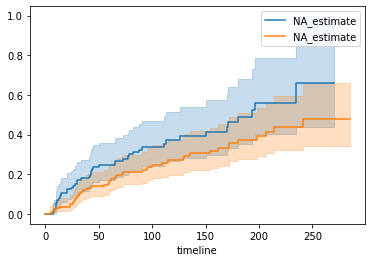

In [95]:
naf_anaemia.plot_cumulative_hazard()
naf_no_anaemia.plot_cumulative_hazard()

### LOG RANK TEST(for anaemia)

In [96]:
# Log-Rank Test
from lifelines.statistics import logrank_test

# Define variables :
A = Anaemia['time']
NA = Anaemia['DEATH_EVENT']
A1 = No_Anaemia['time']
NA1 = No_Anaemia['DEATH_EVENT']

results=logrank_test(A,A1,event_observed_A=NA, event_observed_B=NA1)
results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           2.73 0.10      3.34

#### SEX

In [97]:
#We will perform survival analysis of all categoricak values with death event
kmf_male = KaplanMeierFitter()
kmf_female = KaplanMeierFitter()

#Divide the data into groups 
Male = df.query('sex == 1')
Female = df.query('sex == 0')

In [98]:
kmf_male.fit(durations = Male['time'], event_observed = Male['DEATH_EVENT'], label = 'Male')

kmf_female.fit(durations = Female['time'], event_observed = Female['DEATH_EVENT'], label = 'Female')

<lifelines.KaplanMeierFitter:"Female", fitted with 105 total observations, 71 right-censored observations>

In [99]:
kmf_male.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,194,194
4.0,1,1,0,0,194
6.0,1,1,0,0,193
7.0,2,2,0,0,192
8.0,1,1,0,0,190
...,...,...,...,...,...
250.0,6,0,6,0,12
258.0,2,0,2,0,6
270.0,2,0,2,0,4


In [100]:
kmf_female.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,105,105
8.0,1,1,0,0,105
10.0,1,1,0,0,104
12.0,1,0,1,0,103
15.0,2,2,0,0,102
...,...,...,...,...,...
250.0,1,0,1,0,6
256.0,2,0,2,0,5
257.0,1,0,1,0,3


In [101]:
kmf_male.survival_function_

,Male
timeline,
0.0,1.000000
4.0,0.994845
6.0,0.989691
7.0,0.979381
8.0,0.974227
...,...
250.0,0.561930
258.0,0.561930
270.0,0.561930


In [102]:
kmf_female.survival_function_

,Female
timeline,
0.0,1.000000
8.0,0.990476
10.0,0.980952
12.0,0.980952
15.0,0.961718
...,...
250.0,0.594013
256.0,0.594013
257.0,0.594013


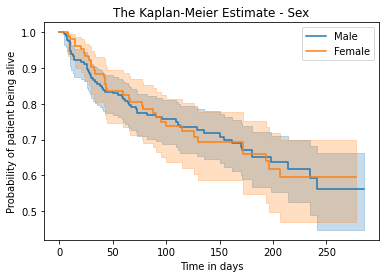

In [103]:
kmf_male.plot()
kmf_female.plot()

plt.title("The Kaplan-Meier Estimate - Sex")
plt.ylabel("Probability of patient being alive")
plt.xlabel("Time in days")
plt.show()

In [104]:
kmf_male.cumulative_density_

,Male
timeline,
0.0,0.000000
4.0,0.005155
6.0,0.010309
7.0,0.020619
8.0,0.025773
...,...
250.0,0.438070
258.0,0.438070
270.0,0.438070


In [105]:
kmf_female.cumulative_density_

,Female
timeline,
0.0,0.000000
8.0,0.009524
10.0,0.019048
12.0,0.019048
15.0,0.038282
...,...
250.0,0.405987
256.0,0.405987
257.0,0.405987


<AxesSubplot:xlabel='timeline'>

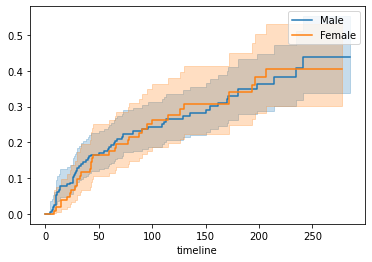

In [106]:
kmf_male.plot_cumulative_density()
kmf_female.plot_cumulative_density()

### log rank test for Sex

In [107]:
A = Male['time']
NA = Male['DEATH_EVENT']
A1 = Female['time']
NA1 = Female['DEATH_EVENT']

results=logrank_test(A,A1,event_observed_A=NA, event_observed_B=NA1)
results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.00 0.95      0.07

#### High BP

In [108]:
#We will perform survival analysis of all categoricak values with death event
kmf_hbp = KaplanMeierFitter()
kmf_no_hbp = KaplanMeierFitter()

#Divide the data into groups 
highBP = df.query('high_blood_pressure == 1')
nohighBP = df.query('high_blood_pressure == 0')


kmf_hbp.fit(durations = highBP['time'], event_observed = highBP['DEATH_EVENT'], label = 'High BP')
kmf_no_hbp.fit(durations = nohighBP['time'], event_observed = nohighBP['DEATH_EVENT'], label = 'No High BP')

<lifelines.KaplanMeierFitter:"No High BP", fitted with 194 total observations, 137 right-censored observations>

In [109]:
kmf_hbp.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,105,105
4.0,1,1,0,0,105
8.0,1,1,0,0,104
10.0,3,3,0,0,103
11.0,1,1,0,0,100
...,...,...,...,...,...
216.0,1,0,1,0,5
230.0,1,0,1,0,4
244.0,1,0,1,0,3


In [110]:
kmf_no_hbp.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,194,194
6.0,1,1,0,0,194
7.0,2,2,0,0,193
8.0,1,1,0,0,191
10.0,3,3,0,0,190
...,...,...,...,...,...
270.0,1,0,1,0,5
271.0,1,0,1,0,4
278.0,1,0,1,0,3


In [111]:
kmf_hbp.survival_function_

,High BP
timeline,
0.0,1.000000
4.0,0.990476
8.0,0.980952
10.0,0.952381
11.0,0.942857
...,...
216.0,0.529384
230.0,0.529384
244.0,0.529384


In [112]:
kmf_no_hbp.survival_function_

,No High BP
timeline,
0.0,1.000000
6.0,0.994845
7.0,0.984536
8.0,0.979381
10.0,0.963918
...,...
270.0,0.609472
271.0,0.609472
278.0,0.609472


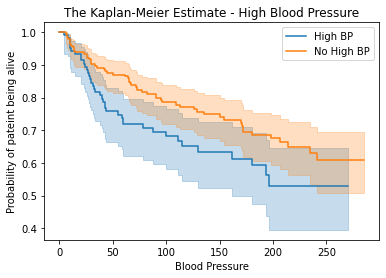

In [113]:
kmf_hbp.plot()
kmf_no_hbp.plot()

plt.title("The Kaplan-Meier Estimate - High Blood Pressure")
plt.ylabel("Probability of pateint being alive")
plt.xlabel("Blood Pressure")
plt.show()

In [114]:
kmf_hbp.cumulative_density_

,High BP
timeline,
0.0,0.000000
4.0,0.009524
8.0,0.019048
10.0,0.047619
11.0,0.057143
...,...
216.0,0.470616
230.0,0.470616
244.0,0.470616


In [115]:
kmf_no_hbp.cumulative_density_

,No High BP
timeline,
0.0,0.000000
6.0,0.005155
7.0,0.015464
8.0,0.020619
10.0,0.036082
...,...
270.0,0.390528
271.0,0.390528
278.0,0.390528


<AxesSubplot:xlabel='timeline'>

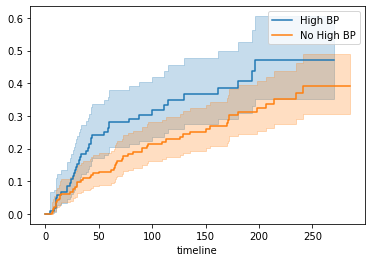

In [116]:
kmf_hbp.plot_cumulative_density()
kmf_no_hbp.plot_cumulative_density()

In [117]:
A = highBP['time']
NA = highBP['DEATH_EVENT']
A1 = nohighBP['time']
NA1 = nohighBP['DEATH_EVENT']
print("LOG RANK TEST FOR HYPERTENSION")
results=logrank_test(A,A1,event_observed_A=NA, event_observed_B=NA1)
results.print_summary()

LOG RANK TEST FOR HYPERTENSION


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           4.41 0.04      4.80

The p-value for high BP is less than 0.05, hence it is significant
LOG RANK TEST RESULT:HYPERTENSION

### Diabetes

In [118]:
#We will perform survival analysis of all categoricak values with death event
kmf_diabetes = KaplanMeierFitter()
kmf_no_diabetes = KaplanMeierFitter()

#Divide the data into groups 
Diabetes = df.query('diabetes == 1')
NoDiabetes = df.query('diabetes == 0')


kmf_diabetes.fit(durations = Diabetes['time'], event_observed = Diabetes['DEATH_EVENT'], label = 'Diabetic')
kmf_no_diabetes.fit(durations = NoDiabetes['time'], event_observed = NoDiabetes['DEATH_EVENT'], label = 'Non Diabetic')

<lifelines.KaplanMeierFitter:"Non Diabetic", fitted with 174 total observations, 118 right-censored observations>

In [119]:
kmf_diabetes.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,125,125
8.0,1,1,0,0,125
10.0,1,1,0,0,124
15.0,1,1,0,0,123
20.0,1,1,0,0,122
...,...,...,...,...,...
256.0,1,0,1,0,6
257.0,1,0,1,0,5
258.0,1,0,1,0,4


In [120]:
kmf_no_diabetes.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,174,174
4.0,1,1,0,0,174
6.0,1,1,0,0,173
7.0,2,2,0,0,172
8.0,1,1,0,0,170
...,...,...,...,...,...
256.0,1,0,1,0,5
258.0,1,0,1,0,4
271.0,1,0,1,0,3


In [121]:
kmf_diabetes.survival_function_

,Diabetic
timeline,
0.0,1.000000
8.0,0.992000
10.0,0.984000
15.0,0.976000
20.0,0.968000
...,...
256.0,0.602494
257.0,0.602494
258.0,0.602494


In [122]:
kmf_no_diabetes.survival_function_

,Non Diabetic
timeline,
0.0,1.000000
4.0,0.994253
6.0,0.988506
7.0,0.977011
8.0,0.971264
...,...
256.0,0.551724
258.0,0.551724
271.0,0.551724


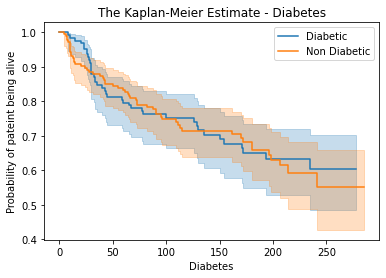

In [123]:
kmf_diabetes.plot()
kmf_no_diabetes.plot()

plt.title("The Kaplan-Meier Estimate - Diabetes")
plt.ylabel("Probability of pateint being alive")
plt.xlabel("Diabetes")
plt.show()

In [124]:
kmf_diabetes.cumulative_density_

,Diabetic
timeline,
0.0,0.000000
8.0,0.008000
10.0,0.016000
15.0,0.024000
20.0,0.032000
...,...
256.0,0.397506
257.0,0.397506
258.0,0.397506


In [125]:
kmf_no_diabetes.cumulative_density_

,Non Diabetic
timeline,
0.0,0.000000
4.0,0.005747
6.0,0.011494
7.0,0.022989
8.0,0.028736
...,...
256.0,0.448276
258.0,0.448276
271.0,0.448276


<AxesSubplot:xlabel='timeline'>

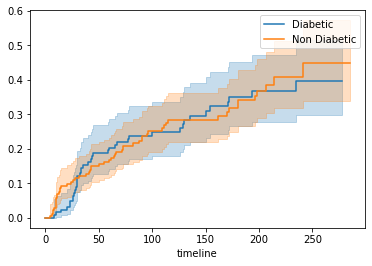

In [126]:
kmf_diabetes.plot_cumulative_density()
kmf_no_diabetes.plot_cumulative_density()

In [127]:
A = Diabetes['time']
NA = Diabetes['DEATH_EVENT']
A1 = NoDiabetes['time']
NA1 = NoDiabetes['DEATH_EVENT']

results=logrank_test(A,A1,event_observed_A=NA, event_observed_B=NA1)
results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.04 0.84      0.25

### Smoking

In [128]:
#We will perform survival analysis of all categoricak values with death event
kmf_smoker = KaplanMeierFitter()
kmf_non_smoker = KaplanMeierFitter()

#Divide the data into groups 
Smoker = df.query('smoking == 1')
nonSmoker = df.query('smoking == 0')


kmf_smoker.fit(durations = Smoker['time'], event_observed = Smoker['DEATH_EVENT'], label = 'Smoker')
kmf_non_smoker.fit(durations = nonSmoker['time'], event_observed = nonSmoker['DEATH_EVENT'], label = 'Non Smoker')

<lifelines.KaplanMeierFitter:"Non Smoker", fitted with 203 total observations, 137 right-censored observations>

In [129]:
kmf_smoker.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,96,96
7.0,1,1,0,0,96
8.0,1,1,0,0,95
10.0,4,4,0,0,94
20.0,1,1,0,0,90
...,...,...,...,...,...
250.0,3,0,3,0,8
258.0,1,0,1,0,5
270.0,2,0,2,0,4


In [130]:
kmf_non_smoker.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,203,203
4.0,1,1,0,0,203
6.0,1,1,0,0,202
7.0,1,1,0,0,201
8.0,1,1,0,0,200
...,...,...,...,...,...
256.0,2,0,2,0,6
257.0,1,0,1,0,4
258.0,1,0,1,0,3


In [131]:
kmf_smoker.survival_function_

,Smoker
timeline,
0.0,1.000000
7.0,0.989583
8.0,0.979167
10.0,0.937500
20.0,0.927083
...,...
250.0,0.594324
258.0,0.594324
270.0,0.594324


In [132]:
kmf_non_smoker.survival_function_

,Non Smoker
timeline,
0.0,1.000000
4.0,0.995074
6.0,0.990148
7.0,0.985222
8.0,0.980296
...,...
256.0,0.568725
257.0,0.568725
258.0,0.568725


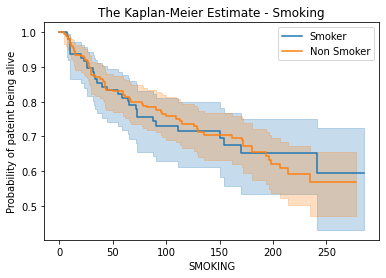

In [133]:
kmf_smoker.plot()
kmf_non_smoker.plot()

plt.title("The Kaplan-Meier Estimate - Smoking")
plt.ylabel("Probability of pateint being alive")
plt.xlabel("SMOKING")
plt.show()

In [134]:
kmf_smoker.cumulative_density_

,Smoker
timeline,
0.0,0.000000
7.0,0.010417
8.0,0.020833
10.0,0.062500
20.0,0.072917
...,...
250.0,0.405676
258.0,0.405676
270.0,0.405676


In [135]:
kmf_non_smoker.cumulative_density_

,Non Smoker
timeline,
0.0,0.000000
4.0,0.004926
6.0,0.009852
7.0,0.014778
8.0,0.019704
...,...
256.0,0.431275
257.0,0.431275
258.0,0.431275


<AxesSubplot:xlabel='timeline'>

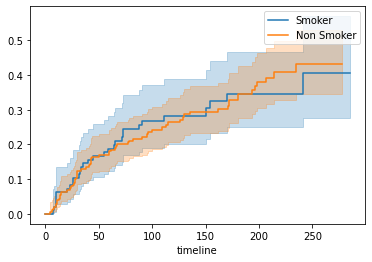

In [136]:
kmf_smoker.plot_cumulative_density()
kmf_non_smoker.plot_cumulative_density()

In [137]:
A = Smoker['time']
NA = Smoker['DEATH_EVENT']
A1 = nonSmoker['time']
NA1 = nonSmoker['DEATH_EVENT']

results=logrank_test(A,A1,event_observed_A=NA, event_observed_B=NA1)
results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.00 0.96      0.05

## COX REGRESSION 

In [138]:
from lifelines import CoxPHFitter

data = df

In [139]:
cph = CoxPHFitter()
cph.fit(data, 'time',event_col = 'DEATH_EVENT')
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 299 total observations, 203 right-censored observations>
             duration col = 'time'
                event col = 'DEATH_EVENT'
      baseline estimation = breslow
   number of observations = 299
number of events observed = 96
   partial log-likelihood = -468.23
         time fit was run = 2022-09-05 21:48:38 UTC

---
                           coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                        
age                        0.05       1.05       0.01             0.03             0.06                 1.03                 1.07
anaemia                    0.46       1.58       0.22             0.04             0.89                 1.04                 2.42
creatinine_phosphokinase   0.00       1.00       0.00             0.00             0.00                 1.00                 1.00
diabetes                   0.14       1.15       0.22            -0.30             0.58                 0.74                 1.78
ejection_fraction         -0.05       0.95       0.01            -0.07            -0.03                 0.93                 0.97
high_blood_pressure        0.48       1.61       0.22             0.05             0.90                 1.05                 2.46
platelets                 -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
serum_creatinine           0.32       1.38       0.07             0.18             0.46                 1.20                 1.58
serum_sodium              -0.04       0.96       0.02            -0.09             0.00                 0.91                 1.00
sex                       -0.24       0.79       0.25            -0.73             0.26                 0.48                 1.29
smoking                    0.13       1.14       0.25            -0.36             0.62                 0.70                 1.86

                           cmp to     z      p   -log2(p)
covariate                                                
age                          0.00  4.98 <0.005      20.56
anaemia                      0.00  2.12   0.03       4.89
creatinine_phosphokinase     0.00  2.23   0.03       5.26
diabetes                     0.00  0.63   0.53       0.91
ejection_fraction            0.00 -4.67 <0.005      18.35
high_blood_pressure          0.00  2.20   0.03       5.17
platelets                    0.00 -0.41   0.68       0.56
serum_creatinine             0.00  4.58 <0.005      17.68
serum_sodium                 0.00 -1.90   0.06       4.12
sex                          0.00 -0.94   0.35       1.53
smoking                      0.00  0.51   0.61       0.72
---
Concordance = 0.74
Partial AIC = 958.46
log-likelihood ratio test = 81.95 on 11 df
-log2(p) of ll-ratio test = 40.56

<AxesSubplot:xlabel='log(HR) (95% CI)'>

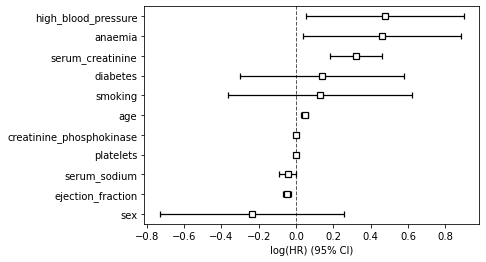

In [140]:
cph.plot()

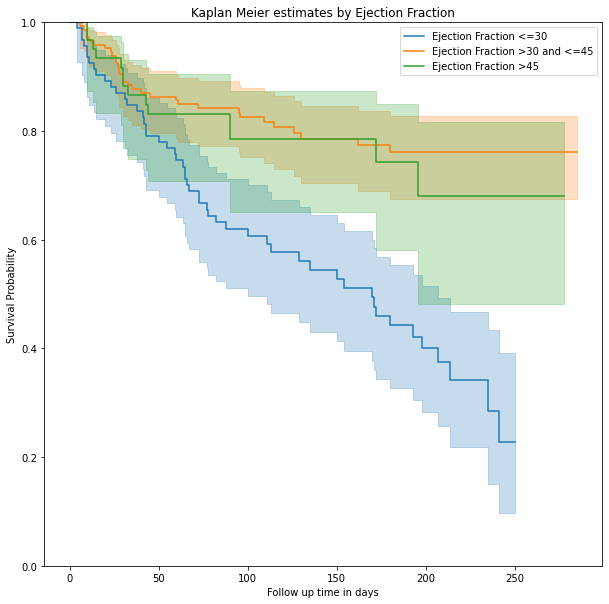

In [141]:
#EJECTION_FRACTION
plt.figure(figsize=(10,10))

X = df[df.ejection_fraction<=30].time
Y = df[df.ejection_fraction<=30].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Ejection Fraction <=30')
kmft.plot()

X = df[(df.ejection_fraction>30)&(df.ejection_fraction<=45)].time
Y = df[(df.ejection_fraction>30)&(df.ejection_fraction<=45)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Ejection Fraction >30 and <=45')
kmft.plot()

X = df[df.ejection_fraction>45].time
Y = df[df.ejection_fraction>45].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Ejection Fraction >45')
kmft.plot()

plt.title("Kaplan Meier estimates by Ejection Fraction")
plt.xlabel("Follow up time in days")
plt.ylabel("Survival Probability")
plt.ylim([0,1])
plt.show()

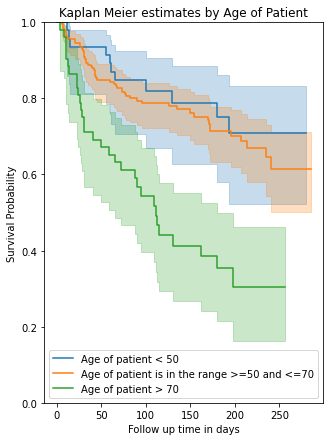

In [142]:
#AGE
plt.figure(figsize=(5,7))

X = df[df.age<50].time
Y = df[df.age<50].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Age of patient < 50')
kmft.plot()

X = df[(df.age>=50)&(df.age<=70)].time
Y = df[(df.age>=50)&(df.age<=70)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Age of patient is in the range >=50 and <=70')
kmft.plot()

X = df[df.age>70].time
Y = df[df.age>70].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Age of patient > 70')
kmft.plot()

plt.title("Kaplan Meier estimates by Age of Patient")
plt.xlabel("Follow up time in days")
plt.ylabel("Survival Probability")
plt.ylim([0,1])
plt.show()

3
67
124
SC>1,Sex F 52
SC>1,Sex F 25
53


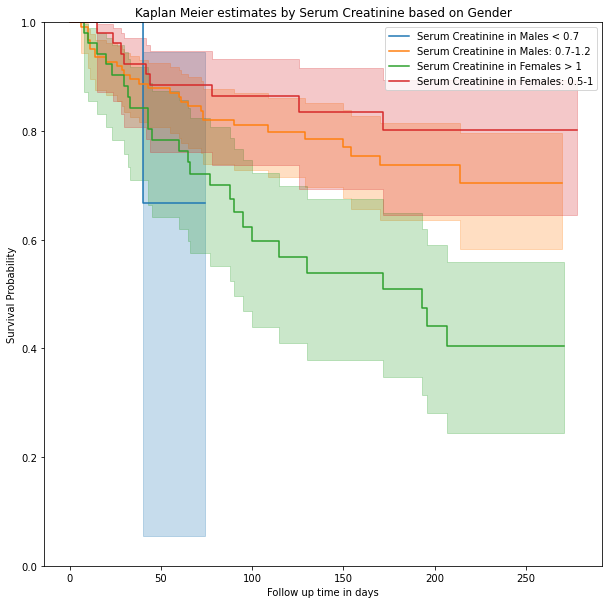

In [143]:
#Serum Creatinine
#the usual reference range for serum creatinine is 
#60–110 micromoles per liter (mcmol/l), or 0.7–1.2 milligrams per deciliter (mg/dl), 
#for males and 45–90 mcmol/l (0.5–1.0 mg/dl) for females.

plt.figure(figsize=(10,10))

#Male and level less than 0.7
X = df[(df.serum_creatinine<0.7) & (df.sex==1)].time
Y = df[(df.serum_creatinine<0.7) & (df.sex==1)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Serum Creatinine in Males < 0.7')
#kmf.plot(ax = ax)
kmft.plot()
print(len(X))

X = df[(df.serum_creatinine>1.2) & (df.sex==1)].time
Y = df[(df.serum_creatinine>1.2) & (df.sex==1)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Serum Creatinine in Males > 1.2')
kmft.plot(ax = ax)
print(len(X))

X = df[((df.serum_creatinine>= 0.7)&(df.serum_creatinine<=1.2)) & (df.sex==1)].time
Y = df[((df.serum_creatinine>= 0.7)&(df.serum_creatinine<=1.2)) & (df.sex==1)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Serum Creatinine in Males: 0.7-1.2')
#kmf.plot(ax = ax)
kmft.plot()
print(len(X))

X = df[(df.serum_creatinine>1) & (df.sex==0)].time
Y = df[(df.serum_creatinine>1) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'Serum Creatinine in Females > 1')
#kmf.plot(ax = ax)
kmft.plot()
print("SC>1,Sex F", len(X))
print("SC>1,Sex F", Y.sum())


X9 = df[((df.serum_creatinine>= 0.5)&(df.serum_creatinine<=1)) & (df.sex==0)].time
Y9 = df[((df.serum_creatinine>= 0.5)&(df.serum_creatinine<=1)) & (df.sex==0)].DEATH_EVENT
kmft.fit(X9, event_observed = Y9, label = 'Serum Creatinine in Females: 0.5-1')
#kmf.plot(ax = ax)
kmft.plot()
print(len(X9))



plt.title("Kaplan Meier estimates by Serum Creatinine based on Gender")
plt.xlabel("Follow up time in days")
plt.ylabel("Survival Probability")
plt.ylim([0,1])
plt.show()

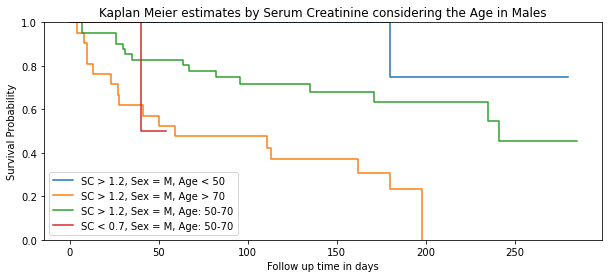

In [144]:
#Serum Creatinine and age
#the usual reference range for serum creatinine is 
#60–110 micromoles per liter (mcmol/l), or 0.7–1.2 milligrams per deciliter (mg/dl), 
#for males and 45–90 mcmol/l (0.5–1.0 mg/dl) for females.

plt.figure(figsize=(10,4))

#Male and level less than 0.7
X1 = df[(df.serum_creatinine > 1.2) & (df.age<50) & (df.sex==1)].time
Y1 = df[(df.serum_creatinine > 1.2) & (df.age<50) & (df.sex==1)].DEATH_EVENT
kmft.fit(X1, event_observed = Y1, label = 'SC > 1.2, Sex = M, Age < 50 ')
kmft.plot(ci_show=False)

X2 = df[(df.serum_creatinine > 1.2) & (df.age>70) & (df.sex==1)].time
Y2 = df[(df.serum_creatinine > 1.2 ) & (df.age>70) & (df.sex==1)].DEATH_EVENT
kmft.fit(X2, event_observed = Y2, label = 'SC > 1.2, Sex = M, Age > 70')
kmft.plot(ci_show=False)

X3 = df[(df.serum_creatinine>1.2) & ((df.age>=50) & (df.age<=70)) & (df.sex==1)].time
Y3 = df[(df.serum_creatinine>1.2) & ((df.age>=50) & (df.age<=70)) & (df.sex==1)].DEATH_EVENT
kmft.fit(X3, event_observed = Y3, label = 'SC > 1.2, Sex = M, Age: 50-70')
kmft.plot(ci_show=False)


X5 = df[(df.serum_creatinine <0.7) & ((df.age>=50) & (df.age<=70)) & (df.sex==1)].time
Y5 = df[(df.serum_creatinine < 0.7) & ((df.age>=50) & (df.age<=70)) & (df.sex==1)].DEATH_EVENT
kmft.fit(X5, event_observed = Y5, label = 'SC < 0.7, Sex = M, Age: 50-70')
kmft.plot(ci_show=False)


plt.title("Kaplan Meier estimates by Serum Creatinine considering the Age in Males")
plt.xlabel("Follow up time in days")
plt.ylabel("Survival Probability")
plt.ylim([0,1])
plt.show()

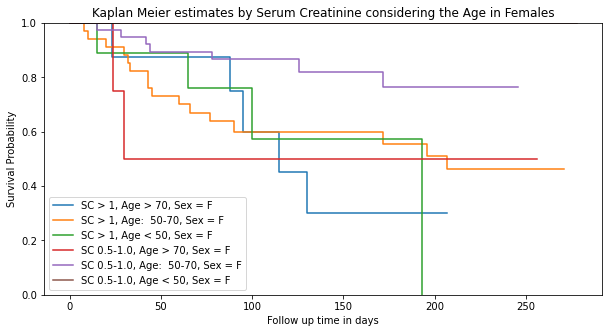

In [145]:

#Females


plt.figure(figsize=(10,5))

X = df[(df.serum_creatinine > 1) & (df.age>70) & (df.sex==0)].time
Y = df[(df.serum_creatinine > 1) & (df.age>70) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'SC > 1, Age > 70, Sex = F')
kmft.plot(ci_show=False)


X = df[(df.serum_creatinine > 1) & ((df.age>=50) & (df.age<=70)) & (df.sex==0)].time
Y = df[(df.serum_creatinine > 1) & ((df.age>=50) & (df.age<=70)) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'SC > 1, Age:  50-70, Sex = F')
kmft.plot(ci_show=False)

X = df[(df.serum_creatinine > 1) & (df.age<50) & (df.sex==0)].time
Y = df[(df.serum_creatinine > 1) & (df.age<50) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'SC > 1, Age < 50, Sex = F')
kmft.plot(ci_show=False)



X = df[((df.serum_creatinine >= 0.5) & (df.serum_creatinine <= 1)) & (df.age>70) & (df.sex==0)].time
Y = df[((df.serum_creatinine >= 0.5) & (df.serum_creatinine <= 1)) & (df.age>70) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'SC 0.5-1.0, Age > 70, Sex = F')
kmft.plot(ci_show=False)


X = df[((df.serum_creatinine >= 0.5) & (df.serum_creatinine <= 1)) & ((df.age>=50) & (df.age<=70)) & (df.sex==0)].time
Y = df[((df.serum_creatinine >= 0.5) & (df.serum_creatinine <= 1)) & ((df.age>=50) & (df.age<=70)) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'SC 0.5-1.0, Age:  50-70, Sex = F')
kmft.plot(ci_show=False)

X = df[((df.serum_creatinine >= 0.5) & (df.serum_creatinine <= 1)) & (df.age<50) & (df.sex==0)].time
Y = df[((df.serum_creatinine >= 0.5) & (df.serum_creatinine <= 1)) & (df.age<50) & (df.sex==0)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'SC 0.5-1.0, Age < 50, Sex = F')
kmft.plot(ci_show=False)

plt.title("Kaplan Meier estimates by Serum Creatinine considering the Age in Females")
plt.xlabel("Follow up time in days")
plt.ylabel("Survival Probability")
plt.ylim([0,1])
plt.show()

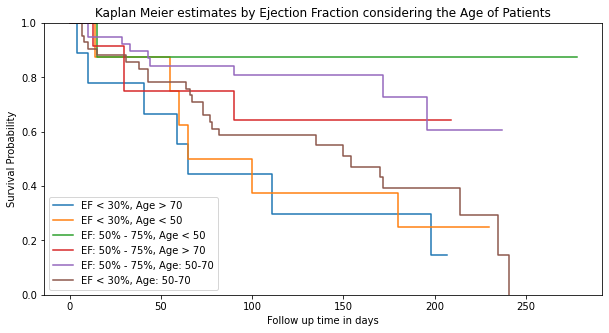

In [146]:
#Ejection_Fraction
plt.figure(figsize=(10,5))

X11 = df[(df.ejection_fraction < 30) & (df.age>70)].time
Y11 = df[(df.ejection_fraction < 30) & (df.age>70)].DEATH_EVENT
kmft.fit(X11, event_observed = Y11, label = 'EF < 30%, Age > 70')
kmft.plot(ci_show=False)


X11 = df[(df.ejection_fraction < 30) & (df.age < 50)].time
Y11 = df[(df.ejection_fraction < 30) & (df.age< 50)].DEATH_EVENT
kmft.fit(X11, event_observed = Y11, label = 'EF < 30%, Age < 50')
kmft.plot(ci_show=False)


X = df[((df.ejection_fraction >= 50) & (df.ejection_fraction <=75)) & (df.age< 50)].time
Y = df[((df.ejection_fraction >= 50) & (df.ejection_fraction <=75)) & (df.age< 50)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'EF: 50% - 75%, Age < 50')
kmft.plot(ci_show=False)


X = df[((df.ejection_fraction >= 50) & (df.ejection_fraction <=75)) & (df.age > 70)].time
Y = df[((df.ejection_fraction >= 50) & (df.ejection_fraction <=75)) & (df.age > 70)].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'EF: 50% - 75%, Age > 70')
kmft.plot(ci_show=False)


X = df[((df.ejection_fraction >= 50) & (df.ejection_fraction <=75)) & ((df.age >= 50) & (df.age <=70))].time
Y = df[((df.ejection_fraction >= 50) & (df.ejection_fraction <=75)) & ((df.age >= 50) & (df.age <=70))].DEATH_EVENT
kmft.fit(X, event_observed = Y, label = 'EF: 50% - 75%, Age: 50-70')
kmft.plot(ci_show=False)

X11 = df[(df.ejection_fraction < 30) & ((df.age >= 50) & (df.age <=70))].time
Y11 = df[(df.ejection_fraction < 30) & ((df.age >= 50) & (df.age <=70))].DEATH_EVENT
kmft.fit(X11, event_observed = Y11, label = 'EF < 30%, Age: 50-70')
kmft.plot(ci_show=False)


plt.title("Kaplan Meier estimates by Ejection Fraction considering the Age of Patients")
plt.xlabel("Follow up time in days")
plt.ylabel("Survival Probability")
plt.ylim([0,1])
plt.show()

### Splitting the dataset into training and testing dataset

In [147]:
from sklearn.model_selection import train_test_split
from collections import Counter

model_data = df

X = model_data.drop(["DEATH_EVENT","time"],axis=1)
y = model_data['DEATH_EVENT']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=0)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(239, 11)
(60, 11)
(239,)
(60,)


### Application of different ML models on the dataset 

#### WITHOUT SMOTE:
#### 1. LOGISTIC REGRESSION

In [148]:
from sklearn.linear_model import LogisticRegression
from colorama import Fore, Back, Style
from sklearn.metrics import confusion_matrix, accuracy_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score

from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold, RepeatedStratifiedKFold, cross_val_score, cross_validate

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, VotingClassifier, GradientBoostingClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_predict, RandomizedSearchCV, train_test_split
from sklearn.metrics import classification_report, PrecisionRecallDisplay, RocCurveDisplay, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

print("Training set size: ", X_train.shape, y_train.shape)
print("Testing set size: ", X_test.shape, y_test.shape)



Training set size:  (239, 11) (239,)
Testing set size:  (60, 11) (60,)


In [149]:
# Scaling the data values
scaler = StandardScaler()
scaler.fit(X_train)

# Transform both train and test
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### Creating a function to estimate accuracy and classification report

In [150]:
"""randomstate = 2000
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=randomstate)

def comp_esti(esti,Xtrain,Xtest,ytrain,ytest):
    esti.fit(Xtrain, ytrain)
    esti_test_preds = esti.predict(Xtest)
    y_pred_train = esti.predict(Xtrain)
    
    print("------------------Cross Validation-------------------------")
    cv_results = cross_validate(esti, Xtrain, ytrain, cv=cv, scoring="accuracy", return_train_score = True)
    print(f"{esti} Training Accuracy score: ", cv_results['train_score'].mean())
    print(f"{esti} Testing Accuracy score: ", cv_results['test_score'].mean()) 
    
    print("------------------One time-------------------------")
    print(f"{esti} Training Accuracy score: ", accuracy_score(ytrain, y_pred_train))
    print(f"{esti} Testing Accuracy score: ", accuracy_score(ytest, esti_test_preds))
    print(f"\n{esti} Classification report:\n", classification_report(ytest, esti_test_preds, digits=6))

    # confusion matrix
    cf_mat = confusion_matrix(ytest, esti_test_preds)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data=cf_mat, annot=True, ax=ax)
    plt.show()"""


randomstate = 2000
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=randomstate)

def comp_esti(esti,Xtrain,Xtest,ytrain,ytest):
    esti.fit(Xtrain, ytrain)
    esti_test_preds = esti.predict(Xtest)
    y_pred_train = esti.predict(Xtrain)
    
    print("------------------Cross Validation-------------------------")
    cv_results = cross_validate(esti, Xtrain, ytrain, cv=cv, scoring=["accuracy","f1"], return_train_score = True)
    print(f"{esti} Training Accuracy score: ", cv_results['train_accuracy'].mean())
    print(f"{esti} Testing Accuracy score: ", cv_results['test_accuracy'].mean()) 
    
    print(f"{esti} Training f1 score: ", cv_results['train_f1'].mean())
    print(f"{esti} Testing f1 score: ", cv_results['test_f1'].mean()) 
    
    
    
    print("------------------One time-------------------------")
    print(f"{esti} Training Accuracy score: ", accuracy_score(ytrain, y_pred_train))
    print(f"{esti} Testing Accuracy score: ", accuracy_score(ytest, esti_test_preds))
    print(f"\n{esti} Classification report:\n", classification_report(ytest, esti_test_preds, digits=6))

    # confusion matrix
    cf_mat = confusion_matrix(ytest, esti_test_preds)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data=cf_mat, annot=True, ax=ax)
    plt.show()

------------------Cross Validation-------------------------
RandomForestClassifier(random_state=2000) Training Accuracy score:  1.0
RandomForestClassifier(random_state=2000) Testing Accuracy score:  0.746256038647343
RandomForestClassifier(random_state=2000) Training f1 score:  1.0
RandomForestClassifier(random_state=2000) Testing f1 score:  0.508826650931914
------------------One time-------------------------
RandomForestClassifier(random_state=2000) Training Accuracy score:  1.0
RandomForestClassifier(random_state=2000) Testing Accuracy score:  0.6833333333333333

RandomForestClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.687500  0.891892  0.776471        37
           1   0.666667  0.347826  0.457143        23

    accuracy                       0.683333        60
   macro avg   0.677083  0.619859  0.616807        60
weighted avg   0.679514  0.683333  0.654062        60



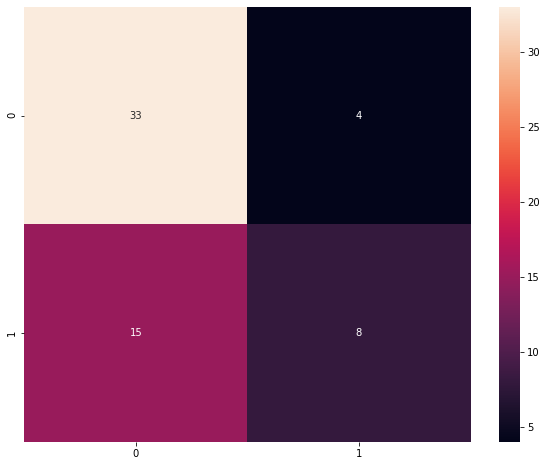

------------------Cross Validation-------------------------
SVC() Training Accuracy score:  0.861462819408556
SVC() Testing Accuracy score:  0.7226449275362319
SVC() Training f1 score:  0.7279609735485687
SVC() Testing f1 score:  0.43418692962810607
------------------One time-------------------------
SVC() Training Accuracy score:  0.8577405857740585
SVC() Testing Accuracy score:  0.7166666666666667

SVC() Classification report:
               precision    recall  f1-score   support

           0   0.717391  0.891892  0.795181        37
           1   0.714286  0.434783  0.540541        23

    accuracy                       0.716667        60
   macro avg   0.715839  0.663337  0.667861        60
weighted avg   0.716201  0.716667  0.697569        60



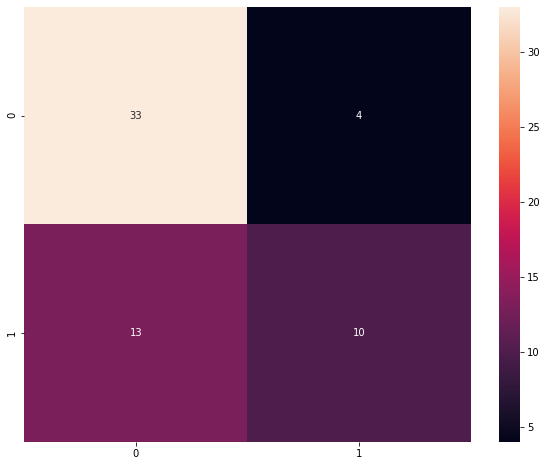

------------------Cross Validation-------------------------
AdaBoostClassifier(random_state=2000) Training Accuracy score:  0.8923047660063165
AdaBoostClassifier(random_state=2000) Testing Accuracy score:  0.7267512077294688
AdaBoostClassifier(random_state=2000) Training f1 score:  0.8139695270791034
AdaBoostClassifier(random_state=2000) Testing f1 score:  0.49714387464387466
------------------One time-------------------------
AdaBoostClassifier(random_state=2000) Training Accuracy score:  0.8828451882845189
AdaBoostClassifier(random_state=2000) Testing Accuracy score:  0.7333333333333333

AdaBoostClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.733333  0.891892  0.804878        37
           1   0.733333  0.478261  0.578947        23

    accuracy                       0.733333        60
   macro avg   0.733333  0.685076  0.691913        60
weighted avg   0.733333  0.733333  0.718271        60



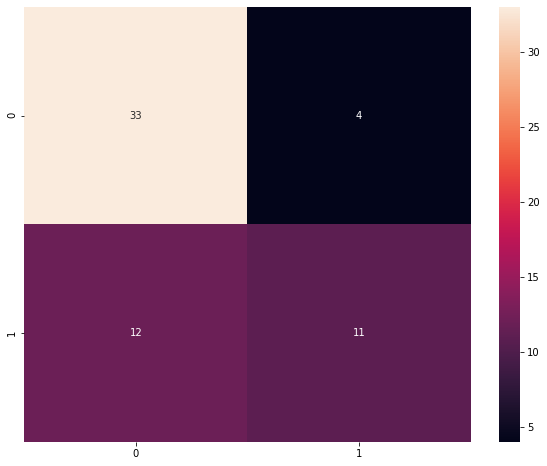

------------------Cross Validation-------------------------
GradientBoostingClassifier(random_state=2000) Training Accuracy score:  0.9905483778351997
GradientBoostingClassifier(random_state=2000) Testing Accuracy score:  0.7295893719806764
GradientBoostingClassifier(random_state=2000) Training f1 score:  0.9841876768997342
GradientBoostingClassifier(random_state=2000) Testing f1 score:  0.5177908202908201
------------------One time-------------------------
GradientBoostingClassifier(random_state=2000) Training Accuracy score:  0.9832635983263598
GradientBoostingClassifier(random_state=2000) Testing Accuracy score:  0.7

GradientBoostingClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.720930  0.837838  0.775000        37
           1   0.647059  0.478261  0.550000        23

    accuracy                       0.700000        60
   macro avg   0.683995  0.658049  0.662500        60
weighted avg   0.692613  0.70

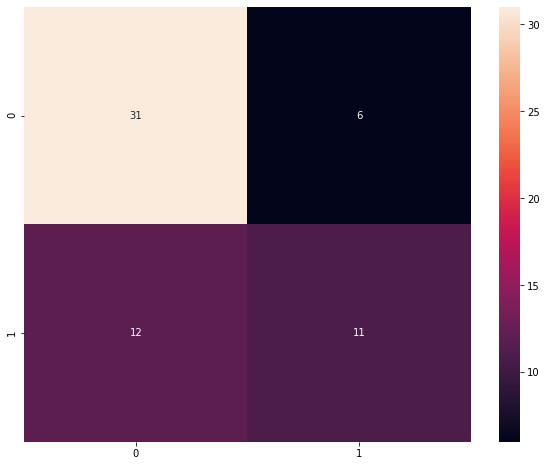

------------------Cross Validation-------------------------
LogisticRegression(random_state=2000) Training Accuracy score:  0.7785529715762274
LogisticRegression(random_state=2000) Testing Accuracy score:  0.7504830917874394
LogisticRegression(random_state=2000) Training f1 score:  0.5724940798517032
LogisticRegression(random_state=2000) Testing f1 score:  0.4948406168994403
------------------One time-------------------------
LogisticRegression(random_state=2000) Training Accuracy score:  0.7782426778242678
LogisticRegression(random_state=2000) Testing Accuracy score:  0.7333333333333333

LogisticRegression(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.714286  0.945946  0.813953        37
           1   0.818182  0.391304  0.529412        23

    accuracy                       0.733333        60
   macro avg   0.766234  0.668625  0.671683        60
weighted avg   0.754113  0.733333  0.704879        60



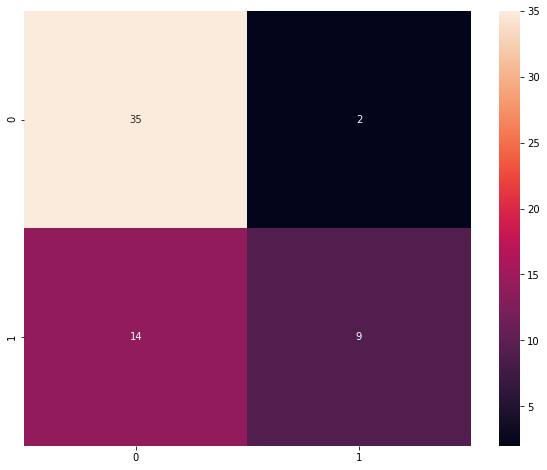

------------------Cross Validation-------------------------
DecisionTreeClassifier(random_state=2000) Training Accuracy score:  1.0
DecisionTreeClassifier(random_state=2000) Testing Accuracy score:  0.6948067632850241
DecisionTreeClassifier(random_state=2000) Training f1 score:  1.0
DecisionTreeClassifier(random_state=2000) Testing f1 score:  0.5063477326480422
------------------One time-------------------------
DecisionTreeClassifier(random_state=2000) Training Accuracy score:  1.0
DecisionTreeClassifier(random_state=2000) Testing Accuracy score:  0.6666666666666666

DecisionTreeClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.688889  0.837838  0.756098        37
           1   0.600000  0.391304  0.473684        23

    accuracy                       0.666667        60
   macro avg   0.644444  0.614571  0.614891        60
weighted avg   0.654815  0.666667  0.647839        60



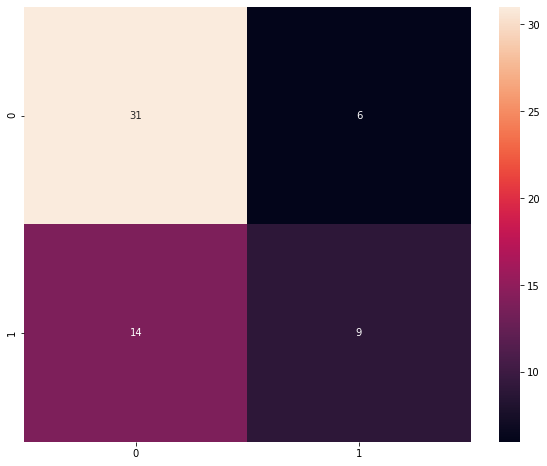

------------------Cross Validation-------------------------
KNeighborsClassifier() Training Accuracy score:  0.7749949755957507
KNeighborsClassifier() Testing Accuracy score:  0.697463768115942
KNeighborsClassifier() Training f1 score:  0.5301863261223645
KNeighborsClassifier() Testing f1 score:  0.26754338254338256
------------------One time-------------------------
KNeighborsClassifier() Training Accuracy score:  0.7782426778242678
KNeighborsClassifier() Testing Accuracy score:  0.6333333333333333

KNeighborsClassifier() Classification report:
               precision    recall  f1-score   support

           0   0.647059  0.891892  0.750000        37
           1   0.555556  0.217391  0.312500        23

    accuracy                       0.633333        60
   macro avg   0.601307  0.554642  0.531250        60
weighted avg   0.611983  0.633333  0.582292        60



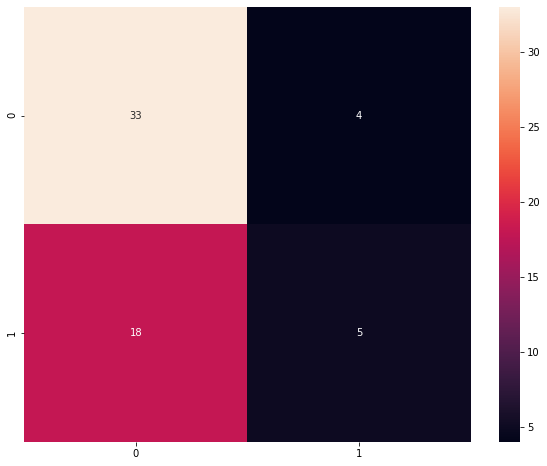

In [151]:

estimators = [
    RandomForestClassifier(random_state=randomstate),
    SVC(),
    AdaBoostClassifier(random_state=randomstate),
    GradientBoostingClassifier(random_state=randomstate),
    LogisticRegression(random_state=randomstate),
    DecisionTreeClassifier(random_state=randomstate),
    KNeighborsClassifier()
]

for esti in estimators:
    comp_esti(esti,X_train,X_test,y_train,y_test)

Random Forest has best accuracy of 0.85

In [152]:

from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score


## SMOTE

In [153]:
from imblearn.over_sampling import SMOTE

df_smote = df
df_smote = df_smote.drop("time",axis = 1)
col_names = df_smote.columns[:-1]
target_col = ["DEATH_EVENT"]
num_cols = ["age", "creatinine_phosphokinase", "ejection_fraction", "platelets" , "serum_creatinine", "serum_sodium"]
bin_cols = ["high_blood_pressure", "sex", "smoking", "anaemia", "diabetes"]
df_smote.head()






,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,1


In [154]:
col_names = list(df_smote.columns)
col_names.remove(target_col[0])

X_smote = df_smote[col_names]
y_smote = df_smote[target_col[0]]

#X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size= 0.2, random_state=0)

oversample = SMOTE()
X_TS, y_TS = oversample.fit_resample(X_smote, y_smote)

X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_TS, y_TS, test_size= 0.2, random_state=0)

df_smote = pd.concat([pd.DataFrame(X_TS), pd.DataFrame(y_TS)], axis=1)
df_smote.columns = col_names + target_col
df_smote


,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,DEATH_EVENT
0,75.000000,0,582,0,20,1,265000.000000,1.900000,130,1,0,1
1,55.000000,0,7861,0,38,0,263358.030000,1.100000,136,1,0,1
2,65.000000,0,146,0,20,0,162000.000000,1.300000,129,1,1,1
3,50.000000,1,111,0,20,0,210000.000000,1.900000,137,1,0,1
4,65.000000,1,160,1,20,0,327000.000000,2.700000,116,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
401,55.292723,0,1889,0,25,0,313121.830683,1.092682,138,0,0,1
402,71.961644,1,327,0,29,1,620590.195032,1.699394,138,0,0,1
403,75.846341,0,4459,0,33,0,243247.396177,1.148438,131,0,0,1
404,67.520321,0,290,0,50,0,263358.030000,1.603963,136,0,0,1


In [155]:
y_train_smote

253    0
315    1
75     1
64     0
55     1
      ..
323    1
192    0
117    0
47     1
172    0
Name: DEATH_EVENT, Length: 324, dtype: int64

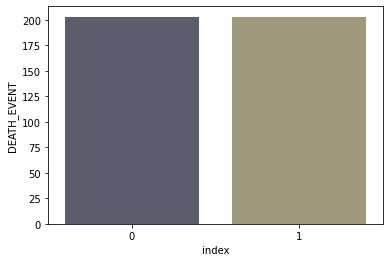

In [156]:
xx = df_smote[target_col[0]].value_counts().reset_index()
sns.barplot(x = "index", y = "DEATH_EVENT", data=xx, palette = "cividis");

In [157]:
'''def comp_esti_smote(estimate):
    estimate.fit(X_train_smote, y_train_smote)
    estimate_test_preds = estimate.predict(X_test_smote)
    y_pred_train_smote = estimate.predict(X_train_smote)
    
    print(f"{estimate} Training Accuracy score: ", accuracy_score(y_train_smote, y_pred_train_smote))
    print(f"{estimate} Testing Accuracy score: ", accuracy_score(y_test_smote, estimate_test_preds))
    print(f"\n{estimate} Classification report:\n", classification_report(y_test_smote, estimate_test_preds, digits=6))
    
    # confusion matrix
    cf_mat = confusion_matrix(y_test_smote, estimate_test_preds)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data=cf_mat, annot=True, ax=ax)
    plt.show()
'''

'def comp_esti_smote(estimate):\n    estimate.fit(X_train_smote, y_train_smote)\n    estimate_test_preds = estimate.predict(X_test_smote)\n    y_pred_train_smote = estimate.predict(X_train_smote)\n    \n    print(f"{estimate} Training Accuracy score: ", accuracy_score(y_train_smote, y_pred_train_smote))\n    print(f"{estimate} Testing Accuracy score: ", accuracy_score(y_test_smote, estimate_test_preds))\n    print(f"\n{estimate} Classification report:\n", classification_report(y_test_smote, estimate_test_preds, digits=6))\n    \n    # confusion matrix\n    cf_mat = confusion_matrix(y_test_smote, estimate_test_preds)\n    fig, ax = plt.subplots(figsize=(10, 8))\n    sns.heatmap(data=cf_mat, annot=True, ax=ax)\n    plt.show()\n'

------------------Cross Validation-------------------------
RandomForestClassifier(random_state=2000) Training Accuracy score:  1.0
RandomForestClassifier(random_state=2000) Testing Accuracy score:  0.7961489898989899
RandomForestClassifier(random_state=2000) Training f1 score:  1.0
RandomForestClassifier(random_state=2000) Testing f1 score:  0.787322206708862
------------------One time-------------------------
RandomForestClassifier(random_state=2000) Training Accuracy score:  1.0
RandomForestClassifier(random_state=2000) Testing Accuracy score:  0.8414634146341463

RandomForestClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.789474  0.857143  0.821918        35
           1   0.886364  0.829787  0.857143        47

    accuracy                       0.841463        82
   macro avg   0.837919  0.843465  0.839530        82
weighted avg   0.845008  0.841463  0.842108        82



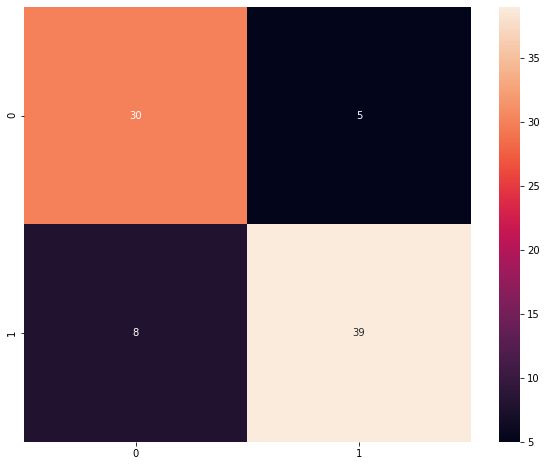

------------------Cross Validation-------------------------
SVC() Training Accuracy score:  0.5683609502738155
SVC() Testing Accuracy score:  0.5526515151515151
SVC() Training f1 score:  0.330275217791436
SVC() Testing f1 score:  0.30030448046652786
------------------One time-------------------------
SVC() Training Accuracy score:  0.5648148148148148
SVC() Testing Accuracy score:  0.4878048780487805

SVC() Classification report:
               precision    recall  f1-score   support

           0   0.447761  0.857143  0.588235        35
           1   0.666667  0.212766  0.322581        47

    accuracy                       0.487805        82
   macro avg   0.557214  0.534954  0.455408        82
weighted avg   0.573231  0.487805  0.435970        82



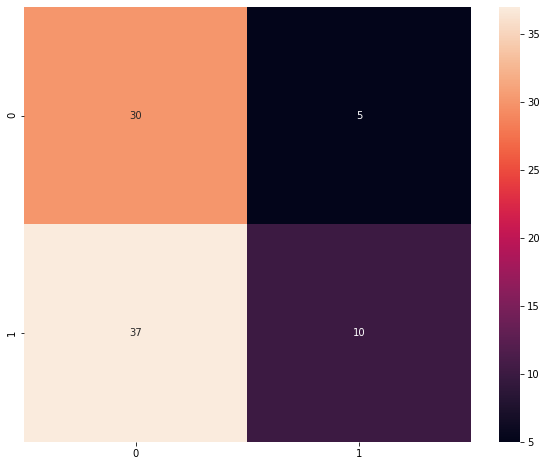

------------------Cross Validation-------------------------
AdaBoostClassifier(random_state=2000) Training Accuracy score:  0.8917419855952549
AdaBoostClassifier(random_state=2000) Testing Accuracy score:  0.7580176767676768
AdaBoostClassifier(random_state=2000) Training f1 score:  0.8873404700472011
AdaBoostClassifier(random_state=2000) Testing f1 score:  0.744123308942498
------------------One time-------------------------
AdaBoostClassifier(random_state=2000) Training Accuracy score:  0.8950617283950617
AdaBoostClassifier(random_state=2000) Testing Accuracy score:  0.7195121951219512

AdaBoostClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.657895  0.714286  0.684932        35
           1   0.772727  0.723404  0.747253        47

    accuracy                       0.719512        82
   macro avg   0.715311  0.718845  0.716092        82
weighted avg   0.723713  0.719512  0.720652        82



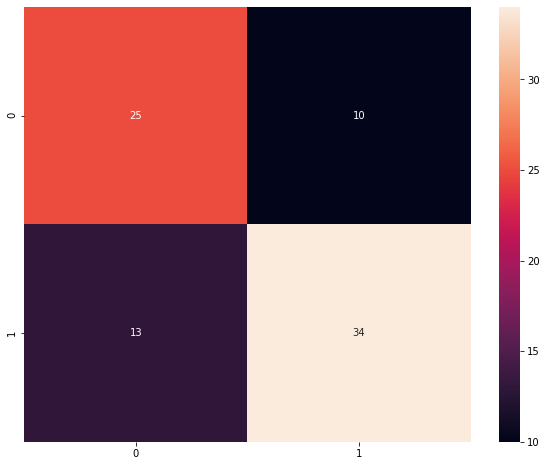

------------------Cross Validation-------------------------
GradientBoostingClassifier(random_state=2000) Training Accuracy score:  0.979425771626732
GradientBoostingClassifier(random_state=2000) Testing Accuracy score:  0.7838068181818182
GradientBoostingClassifier(random_state=2000) Training f1 score:  0.9785282854081707
GradientBoostingClassifier(random_state=2000) Testing f1 score:  0.7771799648051038
------------------One time-------------------------
GradientBoostingClassifier(random_state=2000) Training Accuracy score:  0.9753086419753086
GradientBoostingClassifier(random_state=2000) Testing Accuracy score:  0.8292682926829268

GradientBoostingClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.769231  0.857143  0.810811        35
           1   0.883721  0.808511  0.844444        47

    accuracy                       0.829268        82
   macro avg   0.826476  0.832827  0.827628        82
weighted avg   

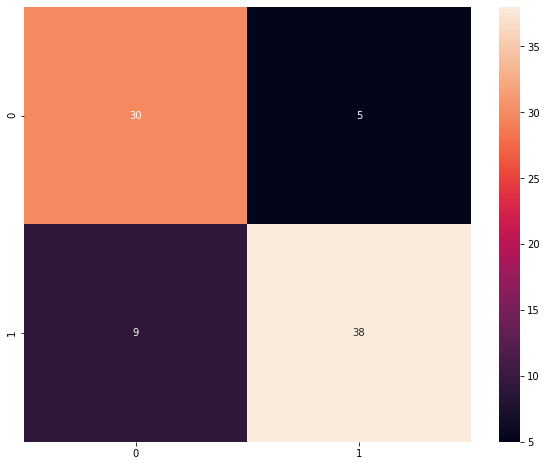

------------------Cross Validation-------------------------


C:\Users\asus\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(random_state=2000) Training Accuracy score:  0.7104454016224956
LogisticRegression(random_state=2000) Testing Accuracy score:  0.6975063131313132
LogisticRegression(random_state=2000) Training f1 score:  0.698562184985568
LogisticRegression(random_state=2000) Testing f1 score:  0.6820399958779205
------------------One time-------------------------
LogisticRegression(random_state=2000) Training Accuracy score:  0.7160493827160493
LogisticRegression(random_state=2000) Testing Accuracy score:  0.6707317073170732

LogisticRegression(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.611111  0.628571  0.619718        35
           1   0.717391  0.702128  0.709677        47

    accuracy                       0.670732        82
   macro avg   0.664251  0.665350  0.664698        82
weighted avg   0.672028  0.670732  0.671280        82



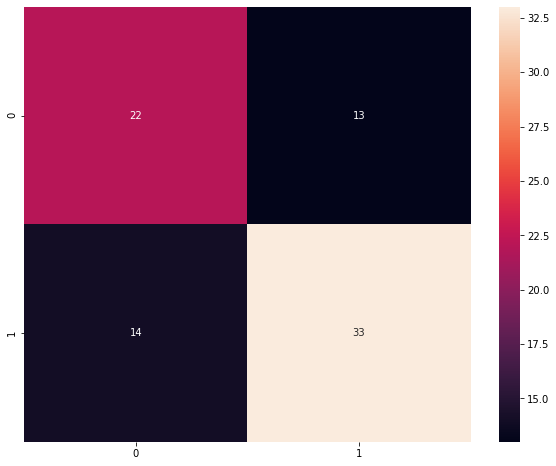

------------------Cross Validation-------------------------
DecisionTreeClassifier(random_state=2000) Training Accuracy score:  1.0
DecisionTreeClassifier(random_state=2000) Testing Accuracy score:  0.7229797979797981
DecisionTreeClassifier(random_state=2000) Training f1 score:  1.0
DecisionTreeClassifier(random_state=2000) Testing f1 score:  0.7126126147079713
------------------One time-------------------------
DecisionTreeClassifier(random_state=2000) Training Accuracy score:  1.0
DecisionTreeClassifier(random_state=2000) Testing Accuracy score:  0.7926829268292683

DecisionTreeClassifier(random_state=2000) Classification report:
               precision    recall  f1-score   support

           0   0.736842  0.800000  0.767123        35
           1   0.840909  0.787234  0.813187        47

    accuracy                       0.792683        82
   macro avg   0.788876  0.793617  0.790155        82
weighted avg   0.796490  0.792683  0.793526        82



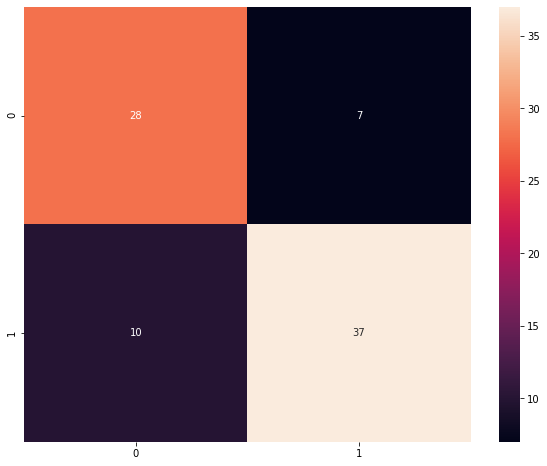

------------------Cross Validation-------------------------
KNeighborsClassifier() Training Accuracy score:  0.7433699728538028
KNeighborsClassifier() Testing Accuracy score:  0.6132260101010101
KNeighborsClassifier() Training f1 score:  0.7321560874063385
KNeighborsClassifier() Testing f1 score:  0.6130269756483524
------------------One time-------------------------
KNeighborsClassifier() Training Accuracy score:  0.7438271604938271
KNeighborsClassifier() Testing Accuracy score:  0.5365853658536586

KNeighborsClassifier() Classification report:
               precision    recall  f1-score   support

           0   0.463415  0.542857  0.500000        35
           1   0.609756  0.531915  0.568182        47

    accuracy                       0.536585        82
   macro avg   0.536585  0.537386  0.534091        82
weighted avg   0.547293  0.536585  0.539080        82



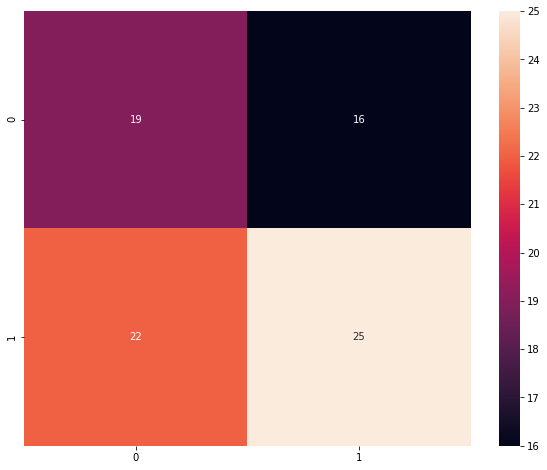

In [158]:
'''estimators = [
    RandomForestClassifier(random_state=2000),
    SVC(),
    AdaBoostClassifier(random_state=2000),
    GradientBoostingClassifier(random_state=2000),
    LogisticRegression(random_state=2000),
    DecisionTreeClassifier(random_state=2000),
    KNeighborsClassifier()
]'''

for estimate in estimators:
    comp_esti(estimate,X_train_smote, X_test_smote, y_train_smote, y_test_smote)

In [159]:
'''std = StandardScaler()

scaled = std.fit_transform(df_smote[num_cols])     # Standardize the columns to get them on the same scale
scaled = pd.DataFrame(scaled, columns=num_cols)

df_train = pd.concat([scaled, df_smote[bin_cols + target_col]], axis=1)

df_train.head()'''

'std = StandardScaler()\n\nscaled = std.fit_transform(df_smote[num_cols])     # Standardize the columns to get them on the same scale\nscaled = pd.DataFrame(scaled, columns=num_cols)\n\ndf_train = pd.concat([scaled, df_smote[bin_cols + target_col]], axis=1)\n\ndf_train.head()'

### Best model and feature selection using best model

In [160]:
randomstate = 2000
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=randomstate)

def comp_esti(esti,Xtrain,Xtest,ytrain,ytest):
    esti.fit(Xtrain, ytrain)
    esti_test_preds = esti.predict(Xtest)
    y_pred_train = esti.predict(Xtrain)
    
    print("------------------Cross Validation-------------------------")
    cv_results = cross_validate(esti, Xtrain, ytrain, cv=cv, scoring="accuracy", return_train_score = True)
    print(f"{esti} Training Accuracy score: ", cv_results['train_score'].mean())
    print(f"{esti} Testing Accuracy score: ", cv_results['test_score'].mean()) 
    
    print("------------------One time-------------------------")
    print(f"{esti} Training Accuracy score: ", accuracy_score(ytrain, y_pred_train))
    print(f"{esti} Testing Accuracy score: ", accuracy_score(ytest, esti_test_preds))
    print(f"\n{esti} Classification report:\n", classification_report(ytest, esti_test_preds, digits=6))

    # confusion matrix
    cf_mat = confusion_matrix(ytest, esti_test_preds)
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(data=cf_mat, annot=True, ax=ax)
    plt.show()

In [161]:
'''accuracy_list = []

log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
log_reg_pred = log_reg.predict(X_test)
log_reg_acc = accuracy_score(y_test, log_reg_pred)

accuracy_list.append(100*log_reg_acc)

print(Fore.GREEN + "Accuracy of Logistic Regression is : ", "{:.2f}%".format(100* log_reg_acc))'''

'accuracy_list = []\n\nlog_reg = LogisticRegression()\nlog_reg.fit(X_train, y_train)\nlog_reg_pred = log_reg.predict(X_test)\nlog_reg_acc = accuracy_score(y_test, log_reg_pred)\n\naccuracy_list.append(100*log_reg_acc)\n\nprint(Fore.GREEN + "Accuracy of Logistic Regression is : ", "{:.2f}%".format(100* log_reg_acc))'

In [162]:
'''#Printing confusion matrix 
cm = confusion_matrix(y_test, log_reg_pred)
plt.figure()
plot_confusion_matrix(cm, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.title("Logistic Regression Model - Confusion Matrix")
plt.xticks(range(2), ["Heart Not Failed","Heart Fail"], fontsize=16)
plt.yticks(range(2), ["Heart Not Failed","Heart Fail"], fontsize=16)
plt.show()'''

'#Printing confusion matrix \ncm = confusion_matrix(y_test, log_reg_pred)\nplt.figure()\nplot_confusion_matrix(cm, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)\nplt.title("Logistic Regression Model - Confusion Matrix")\nplt.xticks(range(2), ["Heart Not Failed","Heart Fail"], fontsize=16)\nplt.yticks(range(2), ["Heart Not Failed","Heart Fail"], fontsize=16)\nplt.show()'

In [163]:
'''log_reg.intercept_'''

'log_reg.intercept_'

In [164]:
'''log_reg.coef_'''

'log_reg.coef_'

In [165]:
X_smote = df_smote.drop("DEATH_EVENT",axis=1)
y_smote = df_smote['DEATH_EVENT']
XS_train, XS_test, ys_train, ys_test = train_test_split(X_smote, y_smote, test_size= 0.2, random_state=0)
accuracy_list_smote = []

log_regs = LogisticRegression()
log_regs.fit(XS_train, ys_train)
log_reg_preds = log_regs.predict(XS_test)
log_reg_accs = accuracy_score(ys_test, log_reg_preds)
accuracy_list_smote.append(100*log_reg_accs)

In [166]:
print(Fore.GREEN + "Accuracy of Logistic Regression is : ", "{:.2f}%".format(100* log_reg_accs))

Accuracy of Logistic Regression is :  67.07%


In [167]:
from sklearn.metrics import confusion_matrix, accuracy_score
from mlxtend.plotting import plot_confusion_matrix

cm = confusion_matrix(y_test, log_reg_pred)
plt.figure()
plot_confusion_matrix(cm, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.title("Logistic Regression Model - Confusion Matrix")
plt.xticks(range(2), ["Heart Not Failed","Heart Fail"], fontsize=16)
plt.yticks(range(2), ["Heart Not Failed","Heart Fail"], fontsize=16)
plt.show()

NameError: name 'log_reg_pred' is not defined

## END AS OF NOW

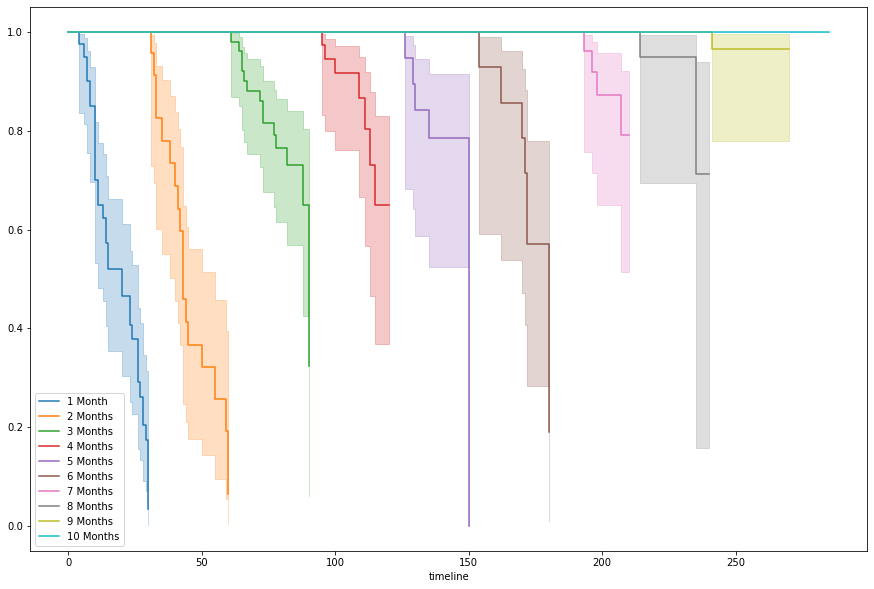

In [169]:
plt.figure(figsize=(15,10))
day_bands = [0,30,60,90,120,150,180,210,240,270,300]
labels = ['1 Month','2 Months','3 Months','4 Months','5 Months','6 Months','7 Months','8 Months','9 Months','10 Months']
df['day_bands'] = pd.cut(df['time'], day_bands, labels = labels)
for day in df['day_bands'].unique():
    d = df['day_bands'] == day
    X = df[d].time
    y = df[d].DEATH_EVENT
    kmft.fit(X, y, label=day)
    kmft.plot()
